# Face Generation
Using generative adversarial networks to generate new images of faces.

### Get the Data
Two datasets:
- MNIST
- CelebA

Since the celebA dataset is complex, test the neural network on MNIST before CelebA.  Running the GANs on MNIST will show how well the model trains sooner.

If using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'

import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. 

View the first number of examples by changing `show_n_images`. 

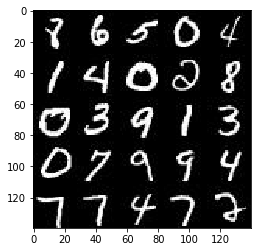

In [2]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  

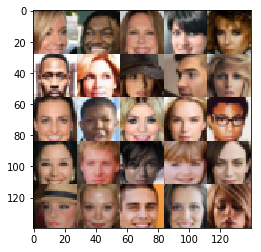

In [3]:
show_n_images = 25

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data

The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).

## Build the Neural Network

### Check the Version of TensorFlow and Access to GPU
This will check to ensure the correct version of TensorFlow and access to a GPU

In [4]:
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel/__main__.py:11: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
The `model_inputs` function creates the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='real_input')
    z = tf.placeholder(tf.float32, (None, z_dim), name='z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return real_input, z, learning_rate


tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
The `discriminator` neural network discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """        
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.2
        
        x0 = tf.layers.conv2d(images, 32, 5, strides=2, padding='same')
        x0 = tf.maximum(alpha * x0, x0)
        
        x1 = tf.layers.conv2d(x0, 64, 5, strides=2, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        
        flat_layer = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat_layer, 1)
        out = tf.sigmoid(logits)
        
    return out, logits


tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
The `generator` generates an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse= not is_train):
        
        alpha = 0.2
        
        # Fully connected layer
        g1 = tf.layers.dense(z, 4*4*512)
        g1 = tf.reshape(g1, (-1, 4, 4, 512))
        g1 =tf.layers.batch_normalization(g1, training=is_train)
        g1 = tf.maximum(alpha * g1, g1)
        
        g2 = tf.layers.conv2d_transpose(g1, 128, 4, strides=1, padding='valid')
        g2 = tf.layers.batch_normalization(g2, training=is_train)
        g2 = tf.maximum(alpha * g2, g2)
        
        g3 = tf.layers.conv2d_transpose(g2, 64, 5, strides=2, padding='same')
        g3 = tf.layers.batch_normalization(g3, training=is_train)
        g3 = tf.maximum(alpha * g3, g3)
        
        g4 = tf.layers.conv2d_transpose(g3, 32, 5, strides=2, padding='same')
        g4 = tf.layers.batch_normalization(g4, training=is_train)
        g4 = tf.maximum(alpha * g4, g4)
        
        # Output layer, 28x28xoutput_dim
        logits = tf.layers.conv2d_transpose(g4, out_channel_dim, 3, strides=1, padding='same')
        
        out = tf.tanh(logits)
        
        return out

tests.test_generator(generator, tf)

Tests Passed


### Loss
`model_loss` builds the GANs for training and calculates the loss.  The function should return a tuple of (discriminator loss, generator loss).  

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                                    labels=tf.ones_like(d_model_fake)))
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                                         labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss

tests.test_model_loss(model_loss)

Tests Passed


### Optimization
`model_opt` creates the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = []
    g_vars = []
    for var in t_vars:
        if var.name.startswith('discriminator'):
            d_vars.append(var)
        elif var.name.startswith('generator'):
            g_vars.append(var)
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    return d_train_opt, g_train_opt

tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training and to help determine how well the GANs is training.

In [10]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
`train` builds and trains the GANs.  

Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    _, image_width, image_height, image_channels = data_shape
    real_input, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(real_input, input_z, image_channels)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    losses = []
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                steps += 1
                batch_images *= 2.0
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={real_input: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={real_input: batch_images, input_z: batch_z, lr: learning_rate})
                
                if steps % 20 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                
                if steps % 100 == 0:
                    show_generator_output(sess, 20, input_z, image_channels, data_image_mode)
                
                
                

### MNIST
Test GANs architecture on MNIST.  

Epoch 1/2... Discriminator Loss: 3.4928... Generator Loss: 0.0717
Epoch 1/2... Discriminator Loss: 0.3469... Generator Loss: 6.9175
Epoch 1/2... Discriminator Loss: 1.5051... Generator Loss: 8.3388
Epoch 1/2... Discriminator Loss: 2.9848... Generator Loss: 0.0953
Epoch 1/2... Discriminator Loss: 1.0650... Generator Loss: 0.8179


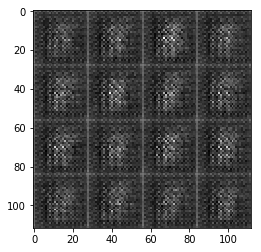

Epoch 1/2... Discriminator Loss: 1.1552... Generator Loss: 2.5911
Epoch 1/2... Discriminator Loss: 2.1799... Generator Loss: 0.2024
Epoch 1/2... Discriminator Loss: 1.0481... Generator Loss: 0.9765
Epoch 1/2... Discriminator Loss: 1.0668... Generator Loss: 0.7347
Epoch 1/2... Discriminator Loss: 0.9276... Generator Loss: 0.9505


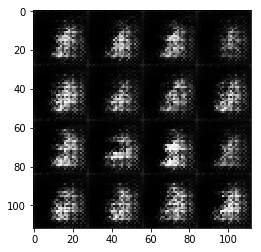

Epoch 1/2... Discriminator Loss: 0.8567... Generator Loss: 1.1520
Epoch 1/2... Discriminator Loss: 0.9736... Generator Loss: 1.4497
Epoch 1/2... Discriminator Loss: 1.9790... Generator Loss: 0.2480
Epoch 1/2... Discriminator Loss: 1.6375... Generator Loss: 0.4171
Epoch 1/2... Discriminator Loss: 1.5532... Generator Loss: 0.3809


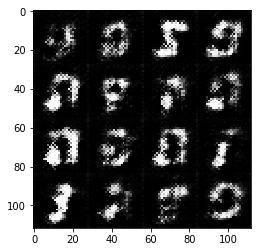

Epoch 1/2... Discriminator Loss: 1.7394... Generator Loss: 0.3021
Epoch 1/2... Discriminator Loss: 1.8004... Generator Loss: 0.2969
Epoch 1/2... Discriminator Loss: 1.5361... Generator Loss: 0.9057
Epoch 1/2... Discriminator Loss: 1.4289... Generator Loss: 0.5060
Epoch 1/2... Discriminator Loss: 1.1674... Generator Loss: 0.7148


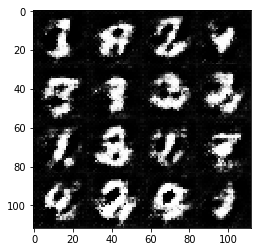

Epoch 1/2... Discriminator Loss: 1.4728... Generator Loss: 0.4728
Epoch 1/2... Discriminator Loss: 1.9957... Generator Loss: 0.2199
Epoch 1/2... Discriminator Loss: 1.3211... Generator Loss: 0.5939
Epoch 1/2... Discriminator Loss: 0.8451... Generator Loss: 1.1131
Epoch 1/2... Discriminator Loss: 1.6341... Generator Loss: 0.5133


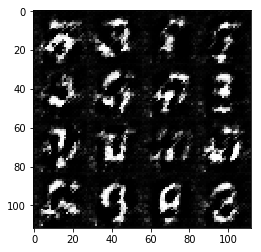

Epoch 1/2... Discriminator Loss: 1.2583... Generator Loss: 0.6253
Epoch 1/2... Discriminator Loss: 0.9679... Generator Loss: 1.1065
Epoch 1/2... Discriminator Loss: 1.4398... Generator Loss: 0.5662
Epoch 1/2... Discriminator Loss: 1.2634... Generator Loss: 0.6351
Epoch 1/2... Discriminator Loss: 0.9586... Generator Loss: 1.3010


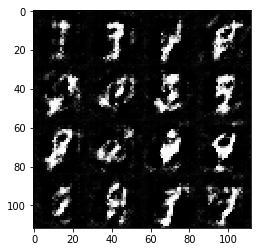

Epoch 1/2... Discriminator Loss: 1.5062... Generator Loss: 0.3955
Epoch 1/2... Discriminator Loss: 0.9417... Generator Loss: 1.3827
Epoch 1/2... Discriminator Loss: 1.0441... Generator Loss: 0.8986
Epoch 1/2... Discriminator Loss: 1.3866... Generator Loss: 1.0657
Epoch 1/2... Discriminator Loss: 1.1572... Generator Loss: 0.7408


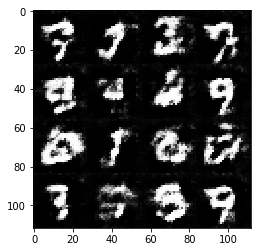

Epoch 1/2... Discriminator Loss: 0.9885... Generator Loss: 1.3846
Epoch 1/2... Discriminator Loss: 1.6458... Generator Loss: 0.3425
Epoch 1/2... Discriminator Loss: 1.5918... Generator Loss: 0.3540
Epoch 1/2... Discriminator Loss: 0.7277... Generator Loss: 1.3366
Epoch 1/2... Discriminator Loss: 1.0933... Generator Loss: 0.9146


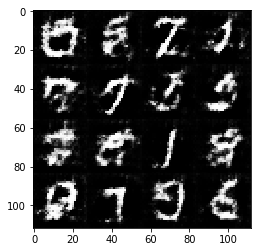

Epoch 1/2... Discriminator Loss: 1.7515... Generator Loss: 0.3170
Epoch 1/2... Discriminator Loss: 1.3163... Generator Loss: 0.6656
Epoch 1/2... Discriminator Loss: 0.9747... Generator Loss: 0.8722
Epoch 1/2... Discriminator Loss: 1.1248... Generator Loss: 0.7173
Epoch 1/2... Discriminator Loss: 1.0082... Generator Loss: 1.0657


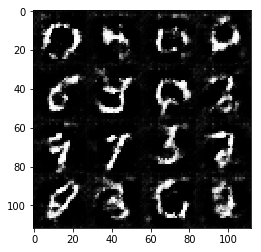

Epoch 1/2... Discriminator Loss: 1.0281... Generator Loss: 0.7839
Epoch 1/2... Discriminator Loss: 0.9099... Generator Loss: 0.9316
Epoch 1/2... Discriminator Loss: 0.8833... Generator Loss: 2.1860
Epoch 1/2... Discriminator Loss: 1.2371... Generator Loss: 0.6077
Epoch 1/2... Discriminator Loss: 1.5722... Generator Loss: 0.4163


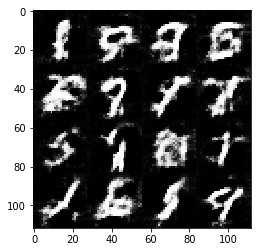

Epoch 1/2... Discriminator Loss: 1.1957... Generator Loss: 0.7037
Epoch 1/2... Discriminator Loss: 0.6595... Generator Loss: 1.5486
Epoch 1/2... Discriminator Loss: 1.4905... Generator Loss: 0.6374
Epoch 1/2... Discriminator Loss: 1.6078... Generator Loss: 0.4413
Epoch 1/2... Discriminator Loss: 1.1040... Generator Loss: 0.6917


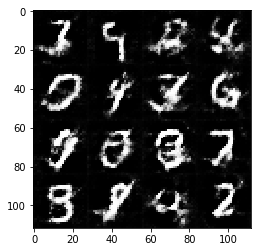

Epoch 1/2... Discriminator Loss: 1.3710... Generator Loss: 0.4611
Epoch 1/2... Discriminator Loss: 1.7464... Generator Loss: 0.3020
Epoch 1/2... Discriminator Loss: 1.3134... Generator Loss: 0.5834
Epoch 1/2... Discriminator Loss: 1.4216... Generator Loss: 1.3067
Epoch 1/2... Discriminator Loss: 1.0642... Generator Loss: 0.7702


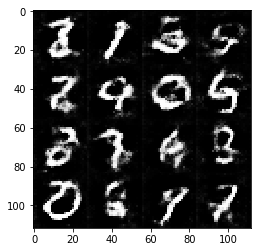

Epoch 1/2... Discriminator Loss: 1.2834... Generator Loss: 0.5892
Epoch 1/2... Discriminator Loss: 1.3123... Generator Loss: 0.5019
Epoch 1/2... Discriminator Loss: 1.0605... Generator Loss: 0.8503
Epoch 1/2... Discriminator Loss: 1.2111... Generator Loss: 0.8475
Epoch 1/2... Discriminator Loss: 1.0411... Generator Loss: 0.9950


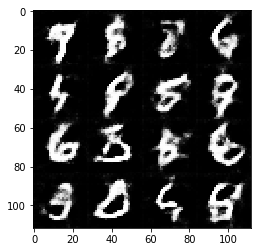

Epoch 1/2... Discriminator Loss: 1.6305... Generator Loss: 0.3323
Epoch 1/2... Discriminator Loss: 1.1967... Generator Loss: 0.7892
Epoch 1/2... Discriminator Loss: 0.9878... Generator Loss: 0.8731
Epoch 1/2... Discriminator Loss: 0.9058... Generator Loss: 1.0999
Epoch 1/2... Discriminator Loss: 1.1603... Generator Loss: 0.6409


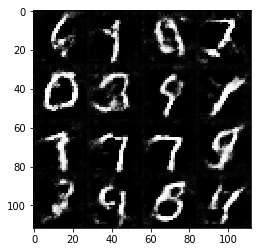

Epoch 1/2... Discriminator Loss: 0.9401... Generator Loss: 0.9424
Epoch 1/2... Discriminator Loss: 0.9165... Generator Loss: 1.1852
Epoch 1/2... Discriminator Loss: 0.9794... Generator Loss: 0.7867
Epoch 1/2... Discriminator Loss: 0.8325... Generator Loss: 1.4957
Epoch 1/2... Discriminator Loss: 0.8722... Generator Loss: 0.9670


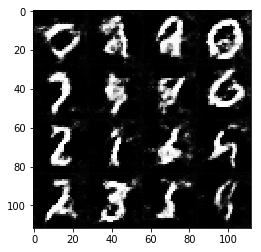

Epoch 1/2... Discriminator Loss: 1.0629... Generator Loss: 0.8375
Epoch 1/2... Discriminator Loss: 0.7853... Generator Loss: 2.0845
Epoch 1/2... Discriminator Loss: 1.6459... Generator Loss: 0.3631
Epoch 1/2... Discriminator Loss: 1.4675... Generator Loss: 0.4399
Epoch 1/2... Discriminator Loss: 1.7013... Generator Loss: 0.2942


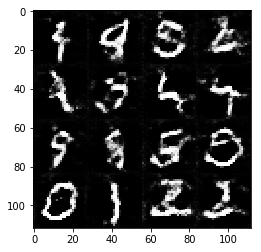

Epoch 1/2... Discriminator Loss: 1.3762... Generator Loss: 0.5291
Epoch 1/2... Discriminator Loss: 0.9577... Generator Loss: 0.9631
Epoch 1/2... Discriminator Loss: 0.7368... Generator Loss: 1.9953
Epoch 1/2... Discriminator Loss: 1.5852... Generator Loss: 0.4427
Epoch 1/2... Discriminator Loss: 0.7171... Generator Loss: 1.2175


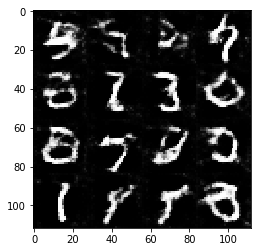

Epoch 1/2... Discriminator Loss: 1.0502... Generator Loss: 0.6766
Epoch 1/2... Discriminator Loss: 0.8109... Generator Loss: 1.7236
Epoch 1/2... Discriminator Loss: 1.3547... Generator Loss: 0.4589
Epoch 1/2... Discriminator Loss: 2.1365... Generator Loss: 0.2216
Epoch 1/2... Discriminator Loss: 0.7741... Generator Loss: 1.1659


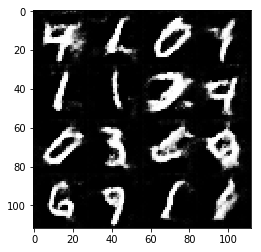

Epoch 1/2... Discriminator Loss: 1.3586... Generator Loss: 0.4969
Epoch 1/2... Discriminator Loss: 0.9020... Generator Loss: 1.2706
Epoch 1/2... Discriminator Loss: 1.4094... Generator Loss: 0.5126
Epoch 1/2... Discriminator Loss: 0.6895... Generator Loss: 1.3050
Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 0.8851


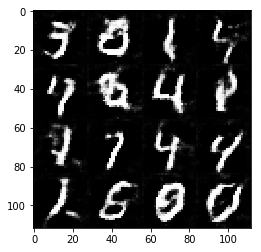

Epoch 1/2... Discriminator Loss: 1.0716... Generator Loss: 1.3410
Epoch 1/2... Discriminator Loss: 1.0645... Generator Loss: 0.9895
Epoch 1/2... Discriminator Loss: 1.0523... Generator Loss: 1.0917
Epoch 1/2... Discriminator Loss: 0.9676... Generator Loss: 0.9971
Epoch 1/2... Discriminator Loss: 1.3446... Generator Loss: 0.5344


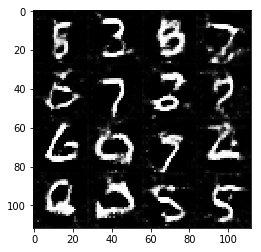

Epoch 1/2... Discriminator Loss: 1.4266... Generator Loss: 0.4776
Epoch 1/2... Discriminator Loss: 0.7348... Generator Loss: 1.1513
Epoch 1/2... Discriminator Loss: 0.6103... Generator Loss: 1.7102
Epoch 1/2... Discriminator Loss: 1.4998... Generator Loss: 0.4135
Epoch 1/2... Discriminator Loss: 1.0783... Generator Loss: 0.8304


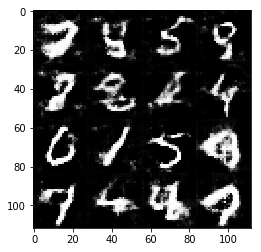

Epoch 1/2... Discriminator Loss: 0.9956... Generator Loss: 0.8699
Epoch 1/2... Discriminator Loss: 0.6195... Generator Loss: 1.6466
Epoch 1/2... Discriminator Loss: 0.7690... Generator Loss: 1.3449
Epoch 1/2... Discriminator Loss: 1.1891... Generator Loss: 0.6130
Epoch 1/2... Discriminator Loss: 0.8110... Generator Loss: 1.1133


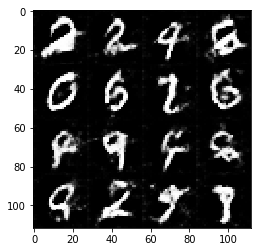

Epoch 1/2... Discriminator Loss: 2.0771... Generator Loss: 0.2077
Epoch 1/2... Discriminator Loss: 1.5027... Generator Loss: 0.6860
Epoch 1/2... Discriminator Loss: 0.6797... Generator Loss: 1.7443
Epoch 1/2... Discriminator Loss: 1.2939... Generator Loss: 0.5076
Epoch 1/2... Discriminator Loss: 1.2859... Generator Loss: 0.5137


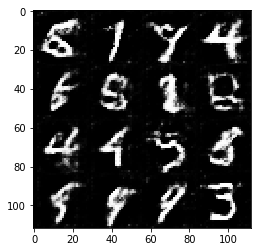

Epoch 1/2... Discriminator Loss: 1.2042... Generator Loss: 0.5804
Epoch 1/2... Discriminator Loss: 0.9960... Generator Loss: 0.7964
Epoch 1/2... Discriminator Loss: 1.1560... Generator Loss: 0.6232
Epoch 1/2... Discriminator Loss: 1.3382... Generator Loss: 0.4924
Epoch 1/2... Discriminator Loss: 1.0883... Generator Loss: 0.6658


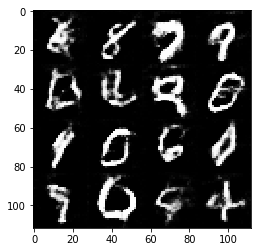

Epoch 1/2... Discriminator Loss: 1.0920... Generator Loss: 0.7207
Epoch 1/2... Discriminator Loss: 0.6683... Generator Loss: 1.4984
Epoch 1/2... Discriminator Loss: 1.6165... Generator Loss: 0.3859
Epoch 1/2... Discriminator Loss: 1.0025... Generator Loss: 1.3758
Epoch 1/2... Discriminator Loss: 0.8893... Generator Loss: 1.0390


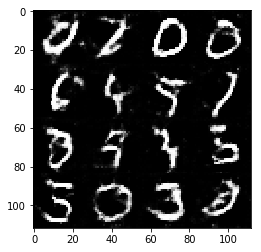

Epoch 1/2... Discriminator Loss: 1.0258... Generator Loss: 0.7479
Epoch 1/2... Discriminator Loss: 1.5858... Generator Loss: 0.3633
Epoch 1/2... Discriminator Loss: 1.0494... Generator Loss: 0.7489
Epoch 1/2... Discriminator Loss: 1.0670... Generator Loss: 0.9633
Epoch 1/2... Discriminator Loss: 1.2296... Generator Loss: 0.5803


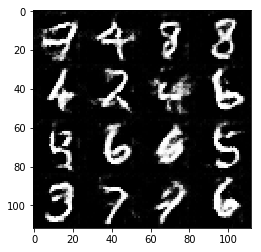

Epoch 1/2... Discriminator Loss: 1.4652... Generator Loss: 0.4442
Epoch 1/2... Discriminator Loss: 1.7594... Generator Loss: 0.2939
Epoch 1/2... Discriminator Loss: 0.8271... Generator Loss: 1.2807
Epoch 1/2... Discriminator Loss: 1.3426... Generator Loss: 0.6921
Epoch 1/2... Discriminator Loss: 1.1015... Generator Loss: 0.7103


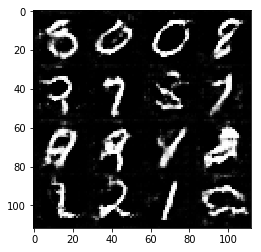

Epoch 1/2... Discriminator Loss: 0.7346... Generator Loss: 1.7749
Epoch 1/2... Discriminator Loss: 0.7175... Generator Loss: 1.6269
Epoch 1/2... Discriminator Loss: 1.4212... Generator Loss: 0.4361
Epoch 1/2... Discriminator Loss: 0.9775... Generator Loss: 1.7539
Epoch 1/2... Discriminator Loss: 0.8925... Generator Loss: 0.9181


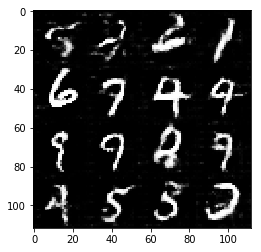

Epoch 1/2... Discriminator Loss: 0.9424... Generator Loss: 0.8545
Epoch 1/2... Discriminator Loss: 0.9261... Generator Loss: 0.9177
Epoch 1/2... Discriminator Loss: 0.7028... Generator Loss: 1.6292
Epoch 1/2... Discriminator Loss: 0.7273... Generator Loss: 1.1904
Epoch 1/2... Discriminator Loss: 1.1184... Generator Loss: 0.6416


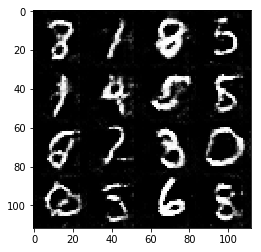

Epoch 1/2... Discriminator Loss: 1.7595... Generator Loss: 0.3093
Epoch 1/2... Discriminator Loss: 1.2266... Generator Loss: 0.6708
Epoch 1/2... Discriminator Loss: 1.3803... Generator Loss: 0.4586
Epoch 1/2... Discriminator Loss: 0.9764... Generator Loss: 0.8703
Epoch 1/2... Discriminator Loss: 1.1071... Generator Loss: 0.7256


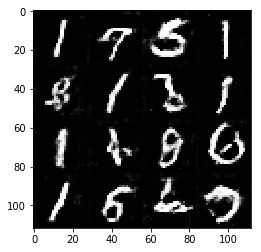

Epoch 1/2... Discriminator Loss: 0.8727... Generator Loss: 1.0226
Epoch 1/2... Discriminator Loss: 0.8581... Generator Loss: 1.0952
Epoch 1/2... Discriminator Loss: 1.3381... Generator Loss: 0.4617
Epoch 1/2... Discriminator Loss: 0.9764... Generator Loss: 0.9650
Epoch 1/2... Discriminator Loss: 1.7569... Generator Loss: 0.2925


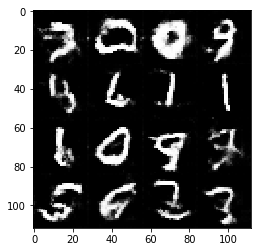

Epoch 1/2... Discriminator Loss: 0.9623... Generator Loss: 0.7936
Epoch 1/2... Discriminator Loss: 1.4282... Generator Loss: 0.4202
Epoch 1/2... Discriminator Loss: 0.8687... Generator Loss: 1.1292
Epoch 1/2... Discriminator Loss: 1.7574... Generator Loss: 0.3031
Epoch 1/2... Discriminator Loss: 1.3620... Generator Loss: 0.4873


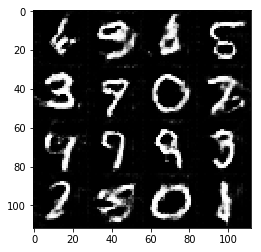

Epoch 1/2... Discriminator Loss: 1.0120... Generator Loss: 0.8872
Epoch 1/2... Discriminator Loss: 0.9896... Generator Loss: 0.7677
Epoch 1/2... Discriminator Loss: 1.0642... Generator Loss: 0.7837
Epoch 1/2... Discriminator Loss: 0.8095... Generator Loss: 1.1752
Epoch 1/2... Discriminator Loss: 1.3111... Generator Loss: 0.5712


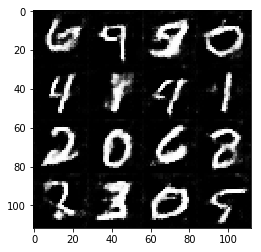

Epoch 1/2... Discriminator Loss: 2.1094... Generator Loss: 0.1945
Epoch 1/2... Discriminator Loss: 0.8573... Generator Loss: 1.0143
Epoch 1/2... Discriminator Loss: 0.9444... Generator Loss: 1.2945
Epoch 1/2... Discriminator Loss: 0.7885... Generator Loss: 1.3822
Epoch 1/2... Discriminator Loss: 1.1563... Generator Loss: 0.6549


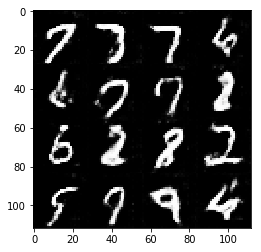

Epoch 1/2... Discriminator Loss: 1.6344... Generator Loss: 0.3265
Epoch 1/2... Discriminator Loss: 1.6419... Generator Loss: 0.4763
Epoch 1/2... Discriminator Loss: 0.9814... Generator Loss: 0.8325
Epoch 1/2... Discriminator Loss: 1.1556... Generator Loss: 0.6477
Epoch 1/2... Discriminator Loss: 1.0920... Generator Loss: 0.7289


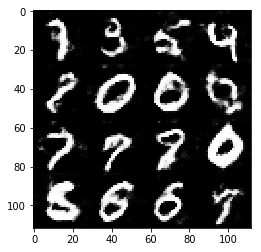

Epoch 1/2... Discriminator Loss: 0.8036... Generator Loss: 1.4206
Epoch 1/2... Discriminator Loss: 1.2472... Generator Loss: 0.6782
Epoch 1/2... Discriminator Loss: 1.3857... Generator Loss: 0.5425
Epoch 1/2... Discriminator Loss: 1.6635... Generator Loss: 0.3137
Epoch 1/2... Discriminator Loss: 0.9487... Generator Loss: 0.9379


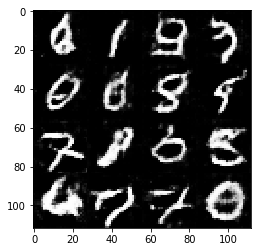

Epoch 1/2... Discriminator Loss: 0.9039... Generator Loss: 1.1035
Epoch 1/2... Discriminator Loss: 0.8232... Generator Loss: 1.4052
Epoch 1/2... Discriminator Loss: 1.1773... Generator Loss: 0.6253
Epoch 1/2... Discriminator Loss: 1.0652... Generator Loss: 0.8234
Epoch 1/2... Discriminator Loss: 1.3528... Generator Loss: 0.4723


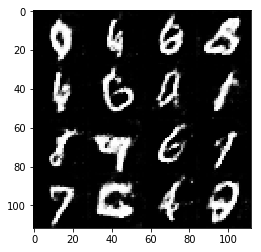

Epoch 1/2... Discriminator Loss: 0.8714... Generator Loss: 1.0340
Epoch 1/2... Discriminator Loss: 1.0150... Generator Loss: 0.9224
Epoch 2/2... Discriminator Loss: 0.7759... Generator Loss: 1.2922
Epoch 2/2... Discriminator Loss: 0.8642... Generator Loss: 1.1472
Epoch 2/2... Discriminator Loss: 0.8680... Generator Loss: 0.9139


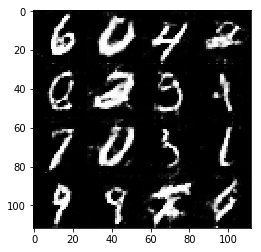

Epoch 2/2... Discriminator Loss: 1.5711... Generator Loss: 0.4272
Epoch 2/2... Discriminator Loss: 0.9108... Generator Loss: 1.0651
Epoch 2/2... Discriminator Loss: 0.8470... Generator Loss: 1.0729
Epoch 2/2... Discriminator Loss: 0.9807... Generator Loss: 0.8556
Epoch 2/2... Discriminator Loss: 0.9543... Generator Loss: 0.9502


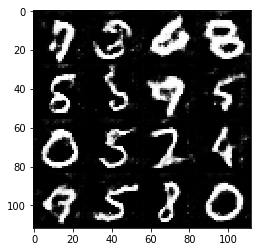

Epoch 2/2... Discriminator Loss: 1.4888... Generator Loss: 0.3996
Epoch 2/2... Discriminator Loss: 1.3332... Generator Loss: 0.7375
Epoch 2/2... Discriminator Loss: 1.1591... Generator Loss: 0.6260
Epoch 2/2... Discriminator Loss: 0.8159... Generator Loss: 1.1864
Epoch 2/2... Discriminator Loss: 1.7791... Generator Loss: 0.3556


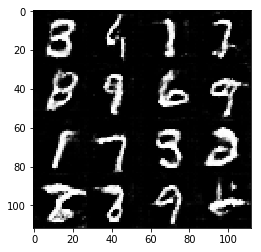

Epoch 2/2... Discriminator Loss: 0.8946... Generator Loss: 0.9610
Epoch 2/2... Discriminator Loss: 0.6691... Generator Loss: 1.3044
Epoch 2/2... Discriminator Loss: 1.3406... Generator Loss: 0.4656
Epoch 2/2... Discriminator Loss: 0.6976... Generator Loss: 1.4319
Epoch 2/2... Discriminator Loss: 1.3306... Generator Loss: 0.5807


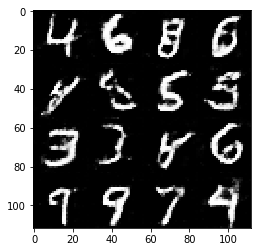

Epoch 2/2... Discriminator Loss: 0.8782... Generator Loss: 0.9217
Epoch 2/2... Discriminator Loss: 0.9448... Generator Loss: 1.0020
Epoch 2/2... Discriminator Loss: 1.1527... Generator Loss: 0.7303
Epoch 2/2... Discriminator Loss: 0.7620... Generator Loss: 1.0960
Epoch 2/2... Discriminator Loss: 1.1046... Generator Loss: 1.6947


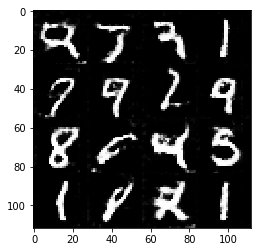

Epoch 2/2... Discriminator Loss: 1.0274... Generator Loss: 0.8990
Epoch 2/2... Discriminator Loss: 0.9393... Generator Loss: 0.8212
Epoch 2/2... Discriminator Loss: 1.4611... Generator Loss: 0.4171
Epoch 2/2... Discriminator Loss: 0.8844... Generator Loss: 0.9506
Epoch 2/2... Discriminator Loss: 1.0486... Generator Loss: 0.7588


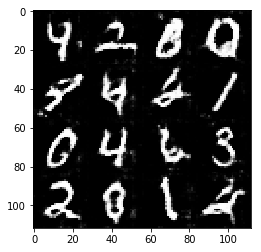

Epoch 2/2... Discriminator Loss: 1.0662... Generator Loss: 0.6701
Epoch 2/2... Discriminator Loss: 1.1737... Generator Loss: 0.5951
Epoch 2/2... Discriminator Loss: 0.7678... Generator Loss: 1.0675
Epoch 2/2... Discriminator Loss: 1.2230... Generator Loss: 0.5668
Epoch 2/2... Discriminator Loss: 1.3140... Generator Loss: 0.5123


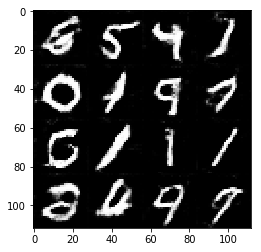

Epoch 2/2... Discriminator Loss: 1.3472... Generator Loss: 0.5823
Epoch 2/2... Discriminator Loss: 1.1796... Generator Loss: 0.6655
Epoch 2/2... Discriminator Loss: 0.9902... Generator Loss: 0.8646
Epoch 2/2... Discriminator Loss: 1.3443... Generator Loss: 0.5168
Epoch 2/2... Discriminator Loss: 0.6665... Generator Loss: 1.2902


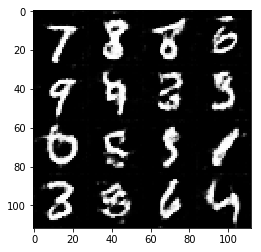

Epoch 2/2... Discriminator Loss: 1.0587... Generator Loss: 0.7727
Epoch 2/2... Discriminator Loss: 2.2943... Generator Loss: 0.2127
Epoch 2/2... Discriminator Loss: 1.7393... Generator Loss: 0.3275
Epoch 2/2... Discriminator Loss: 1.3454... Generator Loss: 0.5351
Epoch 2/2... Discriminator Loss: 1.5872... Generator Loss: 0.3658


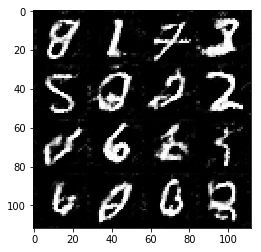

Epoch 2/2... Discriminator Loss: 2.0265... Generator Loss: 0.2342
Epoch 2/2... Discriminator Loss: 1.1729... Generator Loss: 0.7286
Epoch 2/2... Discriminator Loss: 1.4720... Generator Loss: 0.4201
Epoch 2/2... Discriminator Loss: 1.2381... Generator Loss: 0.5216
Epoch 2/2... Discriminator Loss: 1.0499... Generator Loss: 0.7469


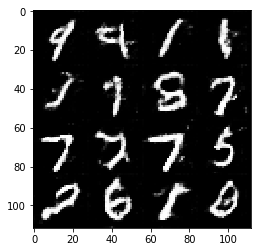

Epoch 2/2... Discriminator Loss: 1.1075... Generator Loss: 0.7058
Epoch 2/2... Discriminator Loss: 0.8405... Generator Loss: 0.9291
Epoch 2/2... Discriminator Loss: 1.5024... Generator Loss: 0.3897
Epoch 2/2... Discriminator Loss: 0.8113... Generator Loss: 1.3678
Epoch 2/2... Discriminator Loss: 0.8186... Generator Loss: 1.2662


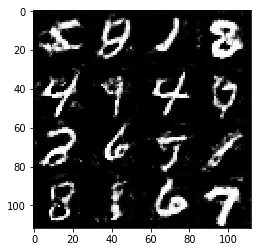

Epoch 2/2... Discriminator Loss: 0.9848... Generator Loss: 0.8185
Epoch 2/2... Discriminator Loss: 0.9744... Generator Loss: 0.8897
Epoch 2/2... Discriminator Loss: 1.0553... Generator Loss: 0.7424
Epoch 2/2... Discriminator Loss: 1.5895... Generator Loss: 0.3427
Epoch 2/2... Discriminator Loss: 1.3493... Generator Loss: 0.4720


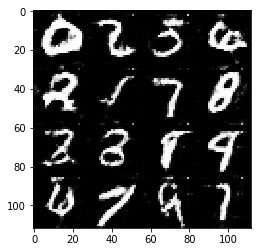

Epoch 2/2... Discriminator Loss: 0.9676... Generator Loss: 0.7930
Epoch 2/2... Discriminator Loss: 0.8283... Generator Loss: 1.2585
Epoch 2/2... Discriminator Loss: 1.2284... Generator Loss: 0.6645
Epoch 2/2... Discriminator Loss: 1.2197... Generator Loss: 0.5796
Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 1.2047


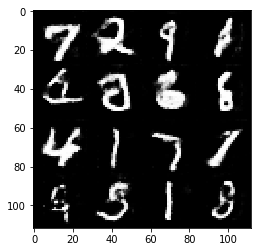

Epoch 2/2... Discriminator Loss: 1.0478... Generator Loss: 0.7213
Epoch 2/2... Discriminator Loss: 1.2322... Generator Loss: 0.6918
Epoch 2/2... Discriminator Loss: 1.5913... Generator Loss: 0.3511
Epoch 2/2... Discriminator Loss: 1.1169... Generator Loss: 0.7515
Epoch 2/2... Discriminator Loss: 0.9389... Generator Loss: 0.8270


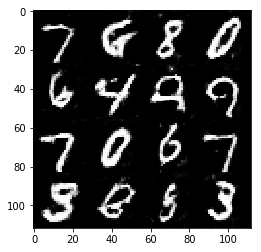

Epoch 2/2... Discriminator Loss: 1.0380... Generator Loss: 0.8543
Epoch 2/2... Discriminator Loss: 1.4294... Generator Loss: 0.4418
Epoch 2/2... Discriminator Loss: 1.2081... Generator Loss: 0.7388
Epoch 2/2... Discriminator Loss: 1.5413... Generator Loss: 0.3906
Epoch 2/2... Discriminator Loss: 0.8104... Generator Loss: 1.0667


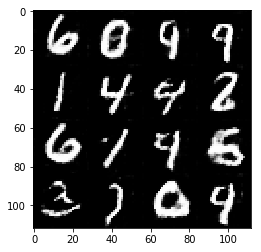

Epoch 2/2... Discriminator Loss: 0.9849... Generator Loss: 0.8137
Epoch 2/2... Discriminator Loss: 1.2596... Generator Loss: 0.5538
Epoch 2/2... Discriminator Loss: 0.7118... Generator Loss: 1.3307
Epoch 2/2... Discriminator Loss: 0.9303... Generator Loss: 0.8693
Epoch 2/2... Discriminator Loss: 1.3674... Generator Loss: 0.4614


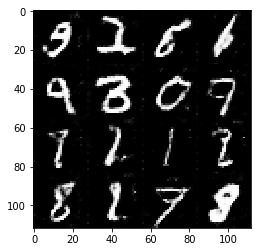

Epoch 2/2... Discriminator Loss: 1.3048... Generator Loss: 0.5323
Epoch 2/2... Discriminator Loss: 1.9745... Generator Loss: 0.2425
Epoch 2/2... Discriminator Loss: 1.1279... Generator Loss: 0.7725
Epoch 2/2... Discriminator Loss: 0.9624... Generator Loss: 0.8382
Epoch 2/2... Discriminator Loss: 1.0879... Generator Loss: 1.9372


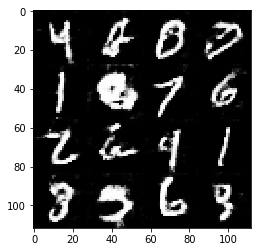

Epoch 2/2... Discriminator Loss: 0.8482... Generator Loss: 1.1584
Epoch 2/2... Discriminator Loss: 1.2009... Generator Loss: 0.5825
Epoch 2/2... Discriminator Loss: 1.7388... Generator Loss: 0.3086
Epoch 2/2... Discriminator Loss: 0.7901... Generator Loss: 1.2305
Epoch 2/2... Discriminator Loss: 1.0200... Generator Loss: 0.7557


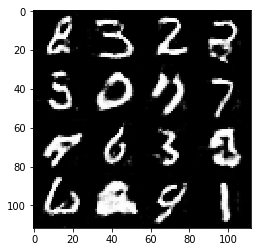

Epoch 2/2... Discriminator Loss: 1.5038... Generator Loss: 0.4254
Epoch 2/2... Discriminator Loss: 0.7334... Generator Loss: 1.2985
Epoch 2/2... Discriminator Loss: 0.8974... Generator Loss: 0.9108
Epoch 2/2... Discriminator Loss: 1.3077... Generator Loss: 0.5074
Epoch 2/2... Discriminator Loss: 1.0757... Generator Loss: 0.6603


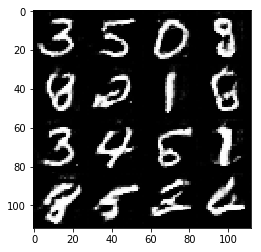

Epoch 2/2... Discriminator Loss: 0.7006... Generator Loss: 1.5391
Epoch 2/2... Discriminator Loss: 1.6606... Generator Loss: 0.3175
Epoch 2/2... Discriminator Loss: 1.2601... Generator Loss: 0.6130
Epoch 2/2... Discriminator Loss: 0.9931... Generator Loss: 0.7554
Epoch 2/2... Discriminator Loss: 0.9913... Generator Loss: 1.0223


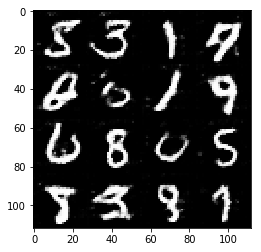

Epoch 2/2... Discriminator Loss: 0.9611... Generator Loss: 0.8949
Epoch 2/2... Discriminator Loss: 0.9203... Generator Loss: 0.9432
Epoch 2/2... Discriminator Loss: 1.4053... Generator Loss: 0.4428
Epoch 2/2... Discriminator Loss: 1.1359... Generator Loss: 0.7133
Epoch 2/2... Discriminator Loss: 1.1520... Generator Loss: 0.6387


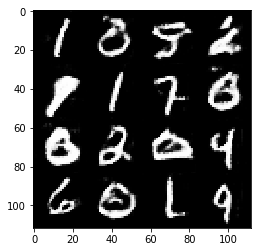

Epoch 2/2... Discriminator Loss: 1.0397... Generator Loss: 0.7778
Epoch 2/2... Discriminator Loss: 1.1054... Generator Loss: 0.6450
Epoch 2/2... Discriminator Loss: 1.5494... Generator Loss: 0.4103
Epoch 2/2... Discriminator Loss: 1.3921... Generator Loss: 0.4507
Epoch 2/2... Discriminator Loss: 1.3837... Generator Loss: 0.4544


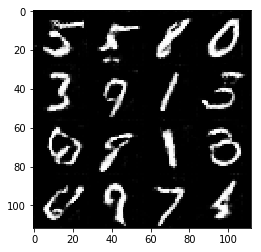

Epoch 2/2... Discriminator Loss: 0.8929... Generator Loss: 1.0009
Epoch 2/2... Discriminator Loss: 0.9962... Generator Loss: 0.8519
Epoch 2/2... Discriminator Loss: 1.8026... Generator Loss: 0.2721
Epoch 2/2... Discriminator Loss: 0.9039... Generator Loss: 1.0011
Epoch 2/2... Discriminator Loss: 1.0552... Generator Loss: 0.7561


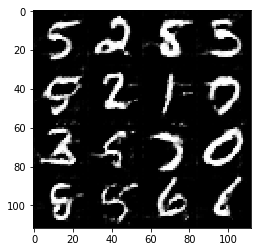

Epoch 2/2... Discriminator Loss: 1.0413... Generator Loss: 0.7072
Epoch 2/2... Discriminator Loss: 1.0265... Generator Loss: 0.7057
Epoch 2/2... Discriminator Loss: 1.8200... Generator Loss: 0.3289
Epoch 2/2... Discriminator Loss: 1.0141... Generator Loss: 0.7723
Epoch 2/2... Discriminator Loss: 1.9901... Generator Loss: 0.2373


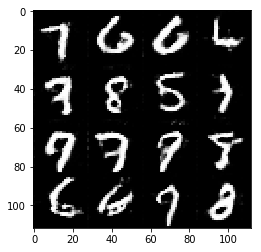

Epoch 2/2... Discriminator Loss: 1.0830... Generator Loss: 0.6622
Epoch 2/2... Discriminator Loss: 1.3919... Generator Loss: 0.4599
Epoch 2/2... Discriminator Loss: 1.1384... Generator Loss: 0.6632
Epoch 2/2... Discriminator Loss: 1.2789... Generator Loss: 0.5664
Epoch 2/2... Discriminator Loss: 1.5876... Generator Loss: 0.3417


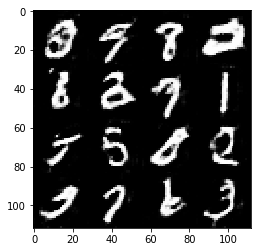

Epoch 2/2... Discriminator Loss: 0.7839... Generator Loss: 1.0532
Epoch 2/2... Discriminator Loss: 0.8565... Generator Loss: 0.9486
Epoch 2/2... Discriminator Loss: 1.4977... Generator Loss: 0.3866
Epoch 2/2... Discriminator Loss: 0.8513... Generator Loss: 1.1486
Epoch 2/2... Discriminator Loss: 1.5402... Generator Loss: 0.3870


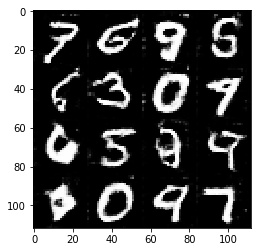

Epoch 2/2... Discriminator Loss: 0.8503... Generator Loss: 1.8495
Epoch 2/2... Discriminator Loss: 1.0839... Generator Loss: 0.8014
Epoch 2/2... Discriminator Loss: 1.3557... Generator Loss: 0.5483
Epoch 2/2... Discriminator Loss: 0.9054... Generator Loss: 1.0234
Epoch 2/2... Discriminator Loss: 0.7494... Generator Loss: 1.3354


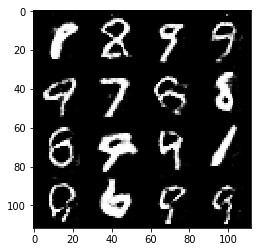

Epoch 2/2... Discriminator Loss: 1.0922... Generator Loss: 0.7305
Epoch 2/2... Discriminator Loss: 0.9404... Generator Loss: 0.8326
Epoch 2/2... Discriminator Loss: 1.5633... Generator Loss: 0.3822
Epoch 2/2... Discriminator Loss: 1.1169... Generator Loss: 0.6448
Epoch 2/2... Discriminator Loss: 0.9104... Generator Loss: 0.9095


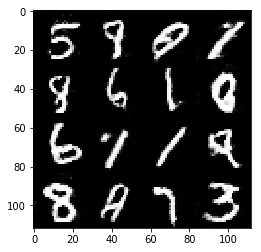

Epoch 2/2... Discriminator Loss: 0.8824... Generator Loss: 1.3262
Epoch 2/2... Discriminator Loss: 1.0325... Generator Loss: 0.6948
Epoch 2/2... Discriminator Loss: 1.2559... Generator Loss: 0.5482
Epoch 2/2... Discriminator Loss: 1.0436... Generator Loss: 0.8008
Epoch 2/2... Discriminator Loss: 0.9483... Generator Loss: 1.0530


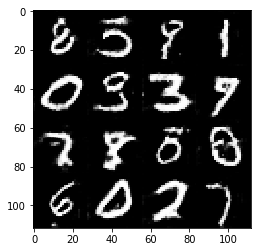

Epoch 2/2... Discriminator Loss: 1.4694... Generator Loss: 0.4164
Epoch 2/2... Discriminator Loss: 0.9319... Generator Loss: 0.8916
Epoch 2/2... Discriminator Loss: 1.1286... Generator Loss: 0.6995
Epoch 2/2... Discriminator Loss: 0.6873... Generator Loss: 1.4696
Epoch 2/2... Discriminator Loss: 2.2569... Generator Loss: 0.1711


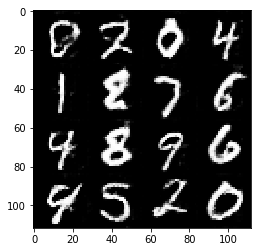

Epoch 2/2... Discriminator Loss: 0.7145... Generator Loss: 1.3342
Epoch 2/2... Discriminator Loss: 0.9904... Generator Loss: 0.9416
Epoch 2/2... Discriminator Loss: 0.9337... Generator Loss: 0.8921
Epoch 2/2... Discriminator Loss: 0.8716... Generator Loss: 1.0866
Epoch 2/2... Discriminator Loss: 1.3298... Generator Loss: 0.5419


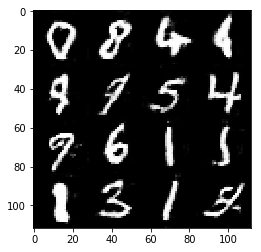

Epoch 2/2... Discriminator Loss: 1.1915... Generator Loss: 0.5945
Epoch 2/2... Discriminator Loss: 1.1866... Generator Loss: 0.6201
Epoch 2/2... Discriminator Loss: 0.8822... Generator Loss: 1.0273
Epoch 2/2... Discriminator Loss: 0.8154... Generator Loss: 1.5528
Epoch 2/2... Discriminator Loss: 1.1892... Generator Loss: 0.6138


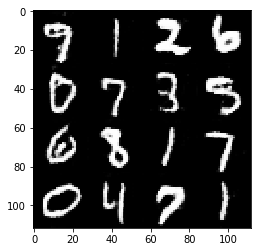

Epoch 2/2... Discriminator Loss: 0.9717... Generator Loss: 0.7807
Epoch 2/2... Discriminator Loss: 0.9455... Generator Loss: 0.8210
Epoch 2/2... Discriminator Loss: 2.1897... Generator Loss: 0.1791
Epoch 2/2... Discriminator Loss: 0.7279... Generator Loss: 1.2296
Epoch 2/2... Discriminator Loss: 1.1054... Generator Loss: 0.6765


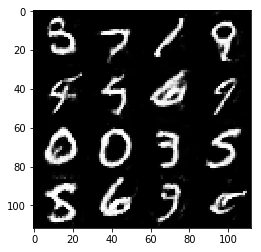

Epoch 2/2... Discriminator Loss: 1.3207... Generator Loss: 0.6010
Epoch 2/2... Discriminator Loss: 0.9837... Generator Loss: 0.8184
Epoch 2/2... Discriminator Loss: 1.8763... Generator Loss: 0.2832
Epoch 2/2... Discriminator Loss: 0.9579... Generator Loss: 0.7964
Epoch 2/2... Discriminator Loss: 1.0677... Generator Loss: 0.7600


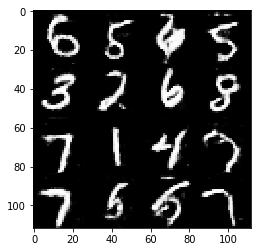

Epoch 2/2... Discriminator Loss: 2.4137... Generator Loss: 0.1506
Epoch 2/2... Discriminator Loss: 0.5598... Generator Loss: 1.9830
Epoch 2/2... Discriminator Loss: 1.8471... Generator Loss: 0.2597
Epoch 2/2... Discriminator Loss: 1.7126... Generator Loss: 0.3115
Epoch 2/2... Discriminator Loss: 1.6488... Generator Loss: 0.3502


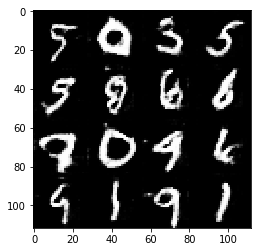

Epoch 2/2... Discriminator Loss: 0.8980... Generator Loss: 1.4794
Epoch 2/2... Discriminator Loss: 2.0774... Generator Loss: 0.2693
Epoch 2/2... Discriminator Loss: 0.4529... Generator Loss: 2.3891
Epoch 2/2... Discriminator Loss: 1.7221... Generator Loss: 0.3489
Epoch 2/2... Discriminator Loss: 1.2063... Generator Loss: 0.5760


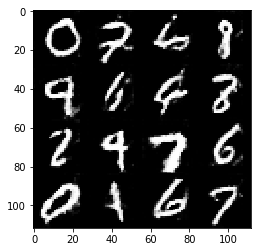

Epoch 2/2... Discriminator Loss: 0.9296... Generator Loss: 0.8752
Epoch 2/2... Discriminator Loss: 1.8038... Generator Loss: 0.2935
Epoch 2/2... Discriminator Loss: 0.9874... Generator Loss: 0.7902
Epoch 2/2... Discriminator Loss: 1.1559... Generator Loss: 0.5884
Epoch 2/2... Discriminator Loss: 1.1431... Generator Loss: 0.5878


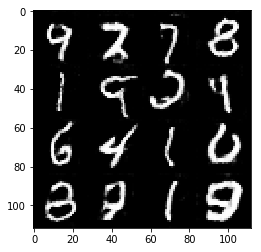

Epoch 2/2... Discriminator Loss: 1.5263... Generator Loss: 0.4492
Epoch 2/2... Discriminator Loss: 1.1092... Generator Loss: 0.6536
Epoch 2/2... Discriminator Loss: 2.6674... Generator Loss: 0.1123
Epoch 2/2... Discriminator Loss: 2.1645... Generator Loss: 0.2235
Epoch 2/2... Discriminator Loss: 1.1664... Generator Loss: 0.6562


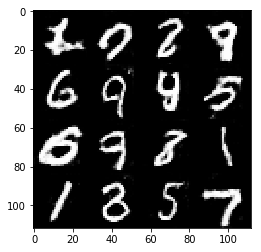

In [12]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run GANs on CelebA.  

Epoch 1/1... Discriminator Loss: 1.0747... Generator Loss: 0.9154
Epoch 1/1... Discriminator Loss: 2.5184... Generator Loss: 0.1378
Epoch 1/1... Discriminator Loss: 0.8574... Generator Loss: 1.0121
Epoch 1/1... Discriminator Loss: 0.4796... Generator Loss: 2.3630
Epoch 1/1... Discriminator Loss: 0.4731... Generator Loss: 2.3850


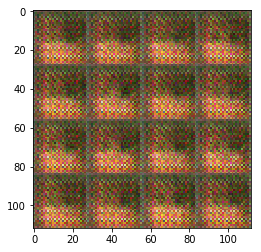

Epoch 1/1... Discriminator Loss: 0.4476... Generator Loss: 2.7752
Epoch 1/1... Discriminator Loss: 0.7475... Generator Loss: 3.9138
Epoch 1/1... Discriminator Loss: 1.2521... Generator Loss: 2.4356
Epoch 1/1... Discriminator Loss: 0.4895... Generator Loss: 2.7014
Epoch 1/1... Discriminator Loss: 0.6294... Generator Loss: 1.8906


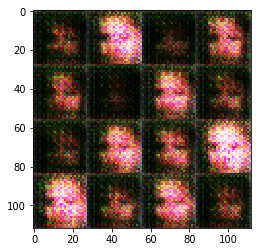

Epoch 1/1... Discriminator Loss: 0.7450... Generator Loss: 1.5483
Epoch 1/1... Discriminator Loss: 1.0231... Generator Loss: 1.1257
Epoch 1/1... Discriminator Loss: 1.1009... Generator Loss: 1.4893
Epoch 1/1... Discriminator Loss: 0.5564... Generator Loss: 1.7769
Epoch 1/1... Discriminator Loss: 0.4650... Generator Loss: 2.4193


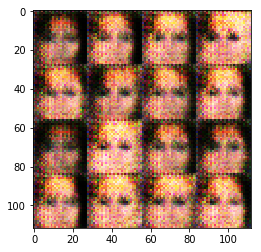

Epoch 1/1... Discriminator Loss: 0.5575... Generator Loss: 3.1178
Epoch 1/1... Discriminator Loss: 0.5882... Generator Loss: 2.2235
Epoch 1/1... Discriminator Loss: 0.6083... Generator Loss: 1.6502
Epoch 1/1... Discriminator Loss: 0.7318... Generator Loss: 1.2401
Epoch 1/1... Discriminator Loss: 0.6482... Generator Loss: 1.5011


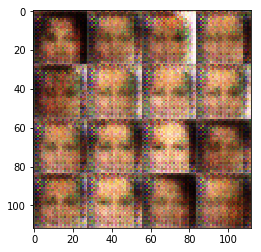

Epoch 1/1... Discriminator Loss: 0.8452... Generator Loss: 1.0213
Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 1.2794
Epoch 1/1... Discriminator Loss: 0.6653... Generator Loss: 1.6858
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.5149
Epoch 1/1... Discriminator Loss: 0.6261... Generator Loss: 1.6135


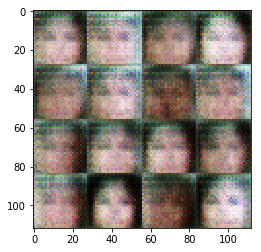

Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 0.8704
Epoch 1/1... Discriminator Loss: 1.0085... Generator Loss: 1.8182
Epoch 1/1... Discriminator Loss: 1.6147... Generator Loss: 0.3764
Epoch 1/1... Discriminator Loss: 1.5449... Generator Loss: 0.3817
Epoch 1/1... Discriminator Loss: 0.6688... Generator Loss: 1.6077


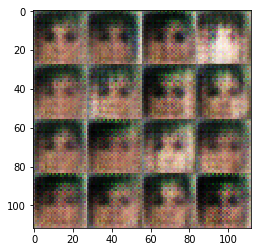

Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 0.4521... Generator Loss: 2.5292
Epoch 1/1... Discriminator Loss: 0.6953... Generator Loss: 1.8325
Epoch 1/1... Discriminator Loss: 1.1002... Generator Loss: 0.8742
Epoch 1/1... Discriminator Loss: 0.6995... Generator Loss: 1.5460


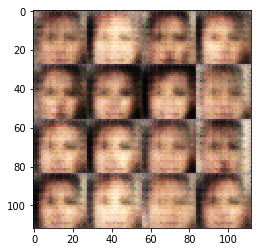

Epoch 1/1... Discriminator Loss: 0.8752... Generator Loss: 1.2866
Epoch 1/1... Discriminator Loss: 0.6192... Generator Loss: 1.7878
Epoch 1/1... Discriminator Loss: 0.6776... Generator Loss: 1.8096
Epoch 1/1... Discriminator Loss: 0.5955... Generator Loss: 2.2479
Epoch 1/1... Discriminator Loss: 1.6161... Generator Loss: 0.4756


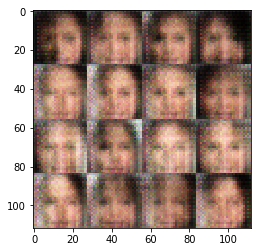

Epoch 1/1... Discriminator Loss: 1.1941... Generator Loss: 1.0082
Epoch 1/1... Discriminator Loss: 1.2109... Generator Loss: 0.5957
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.4517
Epoch 1/1... Discriminator Loss: 0.8538... Generator Loss: 1.1611
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 0.6944


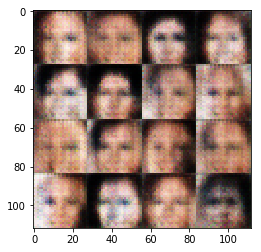

Epoch 1/1... Discriminator Loss: 0.9869... Generator Loss: 0.9961
Epoch 1/1... Discriminator Loss: 1.1172... Generator Loss: 0.7934
Epoch 1/1... Discriminator Loss: 0.8891... Generator Loss: 1.9949
Epoch 1/1... Discriminator Loss: 0.8864... Generator Loss: 1.4733
Epoch 1/1... Discriminator Loss: 0.6338... Generator Loss: 1.5053


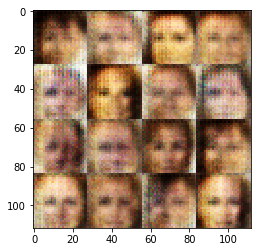

Epoch 1/1... Discriminator Loss: 1.0602... Generator Loss: 0.9328
Epoch 1/1... Discriminator Loss: 1.3190... Generator Loss: 1.1034
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.6274... Generator Loss: 0.4747
Epoch 1/1... Discriminator Loss: 0.8222... Generator Loss: 1.4143


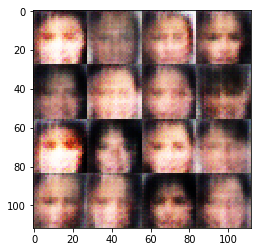

Epoch 1/1... Discriminator Loss: 0.6741... Generator Loss: 1.6335
Epoch 1/1... Discriminator Loss: 0.8866... Generator Loss: 1.1227
Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 1.0833
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 0.9761... Generator Loss: 0.8343


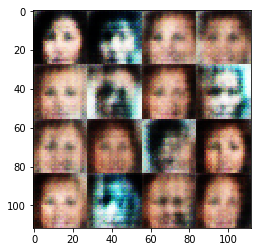

Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 0.6961... Generator Loss: 1.3171
Epoch 1/1... Discriminator Loss: 0.6349... Generator Loss: 1.7497
Epoch 1/1... Discriminator Loss: 0.8945... Generator Loss: 1.0439
Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 1.1686


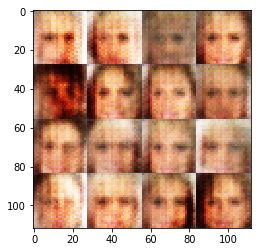

Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.7581
Epoch 1/1... Discriminator Loss: 0.9353... Generator Loss: 1.1090
Epoch 1/1... Discriminator Loss: 1.0138... Generator Loss: 0.8401
Epoch 1/1... Discriminator Loss: 1.3418... Generator Loss: 0.5119
Epoch 1/1... Discriminator Loss: 1.0931... Generator Loss: 0.8034


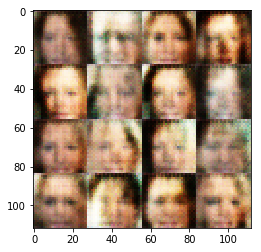

Epoch 1/1... Discriminator Loss: 1.1369... Generator Loss: 0.8009
Epoch 1/1... Discriminator Loss: 1.1001... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.6147
Epoch 1/1... Discriminator Loss: 1.2873... Generator Loss: 0.6032
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.5825


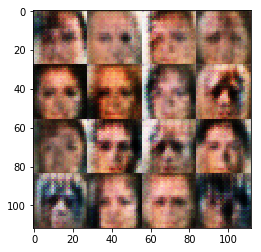

Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.6509
Epoch 1/1... Discriminator Loss: 0.8206... Generator Loss: 1.2705
Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.8022
Epoch 1/1... Discriminator Loss: 1.0929... Generator Loss: 0.9755


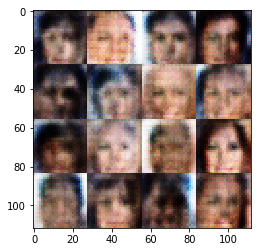

Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.5975
Epoch 1/1... Discriminator Loss: 1.3095... Generator Loss: 0.5912
Epoch 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.7700
Epoch 1/1... Discriminator Loss: 1.1562... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 1.3056... Generator Loss: 0.7697


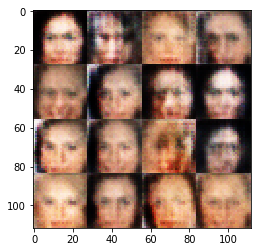

Epoch 1/1... Discriminator Loss: 0.8707... Generator Loss: 1.1369
Epoch 1/1... Discriminator Loss: 1.4858... Generator Loss: 0.7206
Epoch 1/1... Discriminator Loss: 1.1151... Generator Loss: 0.7239
Epoch 1/1... Discriminator Loss: 1.0172... Generator Loss: 1.0793
Epoch 1/1... Discriminator Loss: 1.0268... Generator Loss: 0.8876


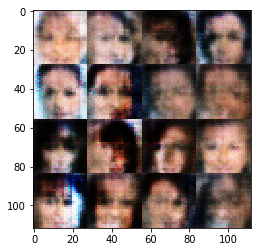

Epoch 1/1... Discriminator Loss: 1.1862... Generator Loss: 1.3945
Epoch 1/1... Discriminator Loss: 1.1143... Generator Loss: 0.7819
Epoch 1/1... Discriminator Loss: 0.9005... Generator Loss: 1.0652
Epoch 1/1... Discriminator Loss: 0.9608... Generator Loss: 0.9159
Epoch 1/1... Discriminator Loss: 1.3411... Generator Loss: 1.4283


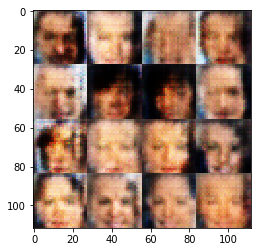

Epoch 1/1... Discriminator Loss: 1.1508... Generator Loss: 0.8117
Epoch 1/1... Discriminator Loss: 1.0698... Generator Loss: 0.8972
Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.5360
Epoch 1/1... Discriminator Loss: 0.9042... Generator Loss: 1.1435


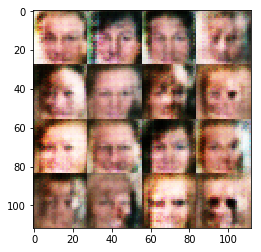

Epoch 1/1... Discriminator Loss: 1.3148... Generator Loss: 0.7526
Epoch 1/1... Discriminator Loss: 1.1506... Generator Loss: 0.8536
Epoch 1/1... Discriminator Loss: 1.0760... Generator Loss: 0.9613
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 0.9034


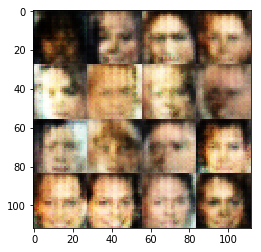

Epoch 1/1... Discriminator Loss: 1.0350... Generator Loss: 0.9757
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.6320
Epoch 1/1... Discriminator Loss: 1.0773... Generator Loss: 0.8091
Epoch 1/1... Discriminator Loss: 0.8590... Generator Loss: 1.0720
Epoch 1/1... Discriminator Loss: 1.2182... Generator Loss: 0.7041


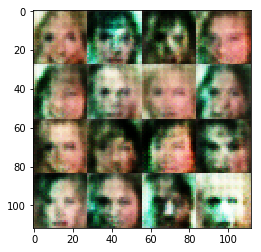

Epoch 1/1... Discriminator Loss: 1.0892... Generator Loss: 0.9047
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 1.0188
Epoch 1/1... Discriminator Loss: 1.1399... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.6052
Epoch 1/1... Discriminator Loss: 1.2538... Generator Loss: 1.5589


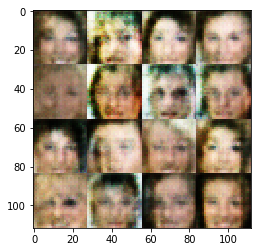

Epoch 1/1... Discriminator Loss: 1.0404... Generator Loss: 0.9104
Epoch 1/1... Discriminator Loss: 1.0947... Generator Loss: 0.7541
Epoch 1/1... Discriminator Loss: 1.0590... Generator Loss: 0.9149
Epoch 1/1... Discriminator Loss: 1.3054... Generator Loss: 0.7432
Epoch 1/1... Discriminator Loss: 1.0706... Generator Loss: 0.8669


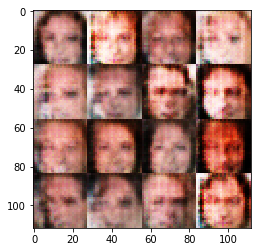

Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 0.7433
Epoch 1/1... Discriminator Loss: 1.0639... Generator Loss: 0.9151
Epoch 1/1... Discriminator Loss: 1.1237... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.8418
Epoch 1/1... Discriminator Loss: 1.4502... Generator Loss: 0.6557


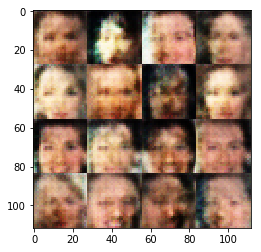

Epoch 1/1... Discriminator Loss: 1.4580... Generator Loss: 0.5531
Epoch 1/1... Discriminator Loss: 0.9568... Generator Loss: 0.9841
Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.7696
Epoch 1/1... Discriminator Loss: 0.9034... Generator Loss: 1.1656
Epoch 1/1... Discriminator Loss: 0.9287... Generator Loss: 1.0611


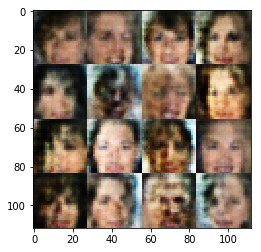

Epoch 1/1... Discriminator Loss: 1.0331... Generator Loss: 0.9962
Epoch 1/1... Discriminator Loss: 1.0706... Generator Loss: 0.8612
Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 0.5390
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.5313
Epoch 1/1... Discriminator Loss: 0.9690... Generator Loss: 1.2079


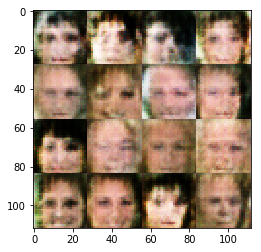

Epoch 1/1... Discriminator Loss: 1.0519... Generator Loss: 0.9843
Epoch 1/1... Discriminator Loss: 0.8022... Generator Loss: 1.7873
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.7062
Epoch 1/1... Discriminator Loss: 1.0721... Generator Loss: 0.8594
Epoch 1/1... Discriminator Loss: 1.0767... Generator Loss: 0.9530


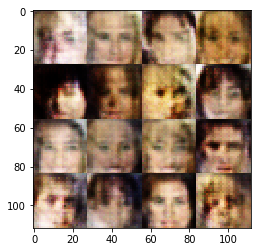

Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.7454
Epoch 1/1... Discriminator Loss: 1.0232... Generator Loss: 1.0145
Epoch 1/1... Discriminator Loss: 0.8924... Generator Loss: 1.1958
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.6199
Epoch 1/1... Discriminator Loss: 1.1888... Generator Loss: 0.6674


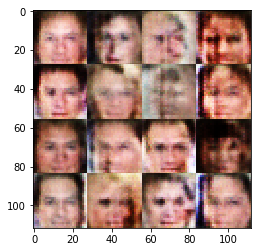

Epoch 1/1... Discriminator Loss: 0.9335... Generator Loss: 1.0814
Epoch 1/1... Discriminator Loss: 1.1252... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.3748... Generator Loss: 0.5106
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.4513
Epoch 1/1... Discriminator Loss: 1.8068... Generator Loss: 0.4477


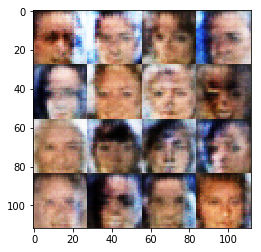

Epoch 1/1... Discriminator Loss: 1.0940... Generator Loss: 1.1783
Epoch 1/1... Discriminator Loss: 1.1299... Generator Loss: 0.9012
Epoch 1/1... Discriminator Loss: 1.4387... Generator Loss: 0.5238
Epoch 1/1... Discriminator Loss: 1.2383... Generator Loss: 0.6841
Epoch 1/1... Discriminator Loss: 1.1907... Generator Loss: 0.8032


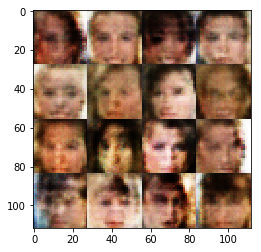

Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 1.1665... Generator Loss: 0.8808
Epoch 1/1... Discriminator Loss: 1.1010... Generator Loss: 0.8142
Epoch 1/1... Discriminator Loss: 0.7321... Generator Loss: 1.3140
Epoch 1/1... Discriminator Loss: 1.3289... Generator Loss: 0.4852


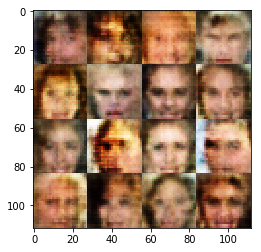

Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.5450
Epoch 1/1... Discriminator Loss: 1.0006... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.6230
Epoch 1/1... Discriminator Loss: 1.1396... Generator Loss: 0.8748
Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.5986


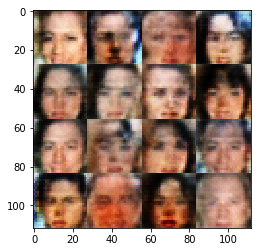

Epoch 1/1... Discriminator Loss: 1.2361... Generator Loss: 0.6449
Epoch 1/1... Discriminator Loss: 1.5811... Generator Loss: 0.4617
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 1.1919
Epoch 1/1... Discriminator Loss: 1.0202... Generator Loss: 0.9205
Epoch 1/1... Discriminator Loss: 1.1759... Generator Loss: 0.6223


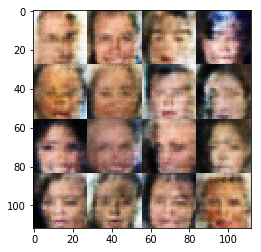

Epoch 1/1... Discriminator Loss: 1.2798... Generator Loss: 0.6010
Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.7137
Epoch 1/1... Discriminator Loss: 0.9796... Generator Loss: 1.2109
Epoch 1/1... Discriminator Loss: 0.9693... Generator Loss: 1.0275


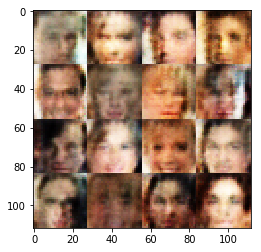

Epoch 1/1... Discriminator Loss: 1.5253... Generator Loss: 0.4266
Epoch 1/1... Discriminator Loss: 0.9424... Generator Loss: 0.9953
Epoch 1/1... Discriminator Loss: 1.8481... Generator Loss: 0.3322
Epoch 1/1... Discriminator Loss: 1.3181... Generator Loss: 0.6575
Epoch 1/1... Discriminator Loss: 1.2339... Generator Loss: 0.7481


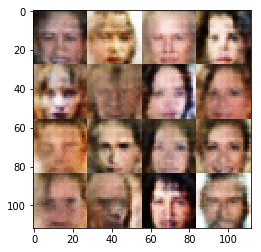

Epoch 1/1... Discriminator Loss: 1.3701... Generator Loss: 0.5079
Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 1.3464... Generator Loss: 0.6127
Epoch 1/1... Discriminator Loss: 1.0082... Generator Loss: 1.0921
Epoch 1/1... Discriminator Loss: 1.7623... Generator Loss: 0.4364


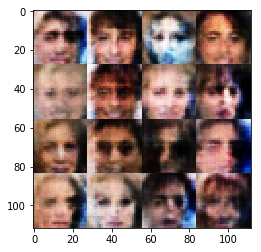

Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.1920... Generator Loss: 0.6548
Epoch 1/1... Discriminator Loss: 1.0964... Generator Loss: 0.7709
Epoch 1/1... Discriminator Loss: 1.1674... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 0.6466


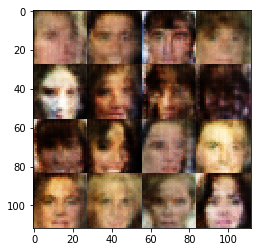

Epoch 1/1... Discriminator Loss: 1.4915... Generator Loss: 0.5158
Epoch 1/1... Discriminator Loss: 1.1795... Generator Loss: 0.6112
Epoch 1/1... Discriminator Loss: 1.1057... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 0.6404


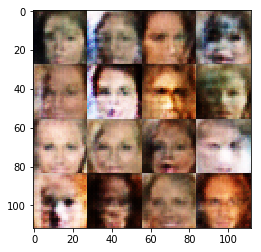

Epoch 1/1... Discriminator Loss: 1.3092... Generator Loss: 0.6203
Epoch 1/1... Discriminator Loss: 0.9493... Generator Loss: 0.8327
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.5856
Epoch 1/1... Discriminator Loss: 1.0708... Generator Loss: 0.9211
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.5079


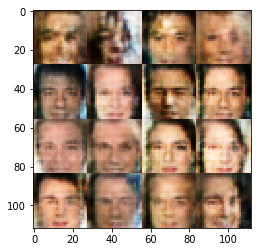

Epoch 1/1... Discriminator Loss: 0.9890... Generator Loss: 1.0346
Epoch 1/1... Discriminator Loss: 0.9257... Generator Loss: 0.9062
Epoch 1/1... Discriminator Loss: 1.2403... Generator Loss: 0.6608
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.6905
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 0.7308


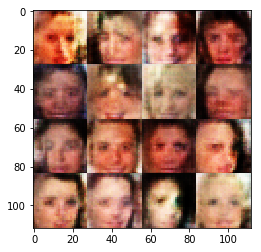

Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 0.8636... Generator Loss: 1.1144
Epoch 1/1... Discriminator Loss: 1.0514... Generator Loss: 0.9426
Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 0.6676
Epoch 1/1... Discriminator Loss: 1.8304... Generator Loss: 0.2798


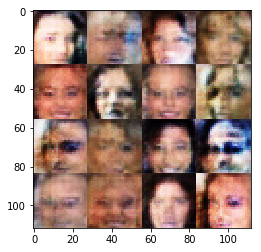

Epoch 1/1... Discriminator Loss: 1.2259... Generator Loss: 0.8430
Epoch 1/1... Discriminator Loss: 1.3366... Generator Loss: 0.5821
Epoch 1/1... Discriminator Loss: 1.0448... Generator Loss: 1.3703
Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.4870... Generator Loss: 0.5032


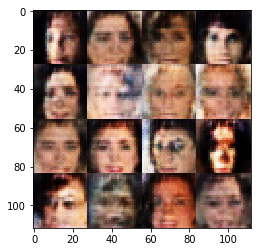

Epoch 1/1... Discriminator Loss: 1.0377... Generator Loss: 0.7388
Epoch 1/1... Discriminator Loss: 1.2304... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.0018... Generator Loss: 0.9345
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.4623
Epoch 1/1... Discriminator Loss: 1.1950... Generator Loss: 0.7103


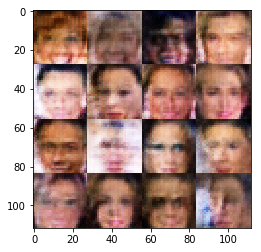

Epoch 1/1... Discriminator Loss: 1.0858... Generator Loss: 0.8496
Epoch 1/1... Discriminator Loss: 1.1448... Generator Loss: 0.8112
Epoch 1/1... Discriminator Loss: 0.9877... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.0684... Generator Loss: 0.8362
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.5978


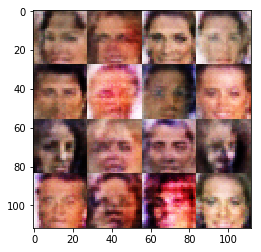

Epoch 1/1... Discriminator Loss: 1.5267... Generator Loss: 0.4305
Epoch 1/1... Discriminator Loss: 1.1397... Generator Loss: 0.9623
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.5081
Epoch 1/1... Discriminator Loss: 1.0827... Generator Loss: 0.8423
Epoch 1/1... Discriminator Loss: 1.2886... Generator Loss: 0.5422


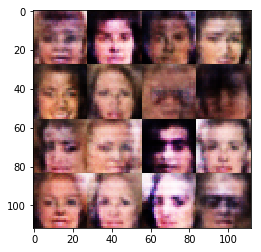

Epoch 1/1... Discriminator Loss: 1.2700... Generator Loss: 0.5150
Epoch 1/1... Discriminator Loss: 1.1659... Generator Loss: 0.7076
Epoch 1/1... Discriminator Loss: 1.1858... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 0.9824... Generator Loss: 0.9669
Epoch 1/1... Discriminator Loss: 1.4067... Generator Loss: 0.5477


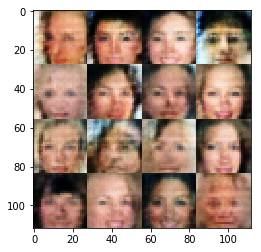

Epoch 1/1... Discriminator Loss: 1.9599... Generator Loss: 0.2822
Epoch 1/1... Discriminator Loss: 0.9722... Generator Loss: 1.0224
Epoch 1/1... Discriminator Loss: 1.2544... Generator Loss: 0.6910
Epoch 1/1... Discriminator Loss: 1.4222... Generator Loss: 0.4688
Epoch 1/1... Discriminator Loss: 1.1355... Generator Loss: 0.6888


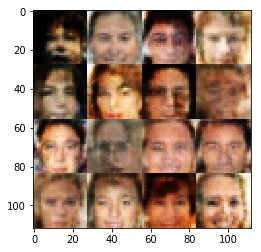

Epoch 1/1... Discriminator Loss: 1.0356... Generator Loss: 0.8345
Epoch 1/1... Discriminator Loss: 1.6142... Generator Loss: 0.4062
Epoch 1/1... Discriminator Loss: 0.8563... Generator Loss: 0.9902
Epoch 1/1... Discriminator Loss: 1.2655... Generator Loss: 0.5924
Epoch 1/1... Discriminator Loss: 1.3044... Generator Loss: 0.5923


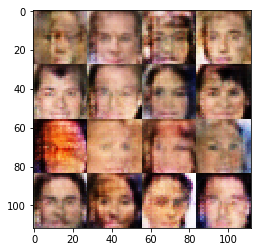

Epoch 1/1... Discriminator Loss: 1.2071... Generator Loss: 1.5369
Epoch 1/1... Discriminator Loss: 1.1403... Generator Loss: 0.8276
Epoch 1/1... Discriminator Loss: 1.2692... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.5099... Generator Loss: 0.6171
Epoch 1/1... Discriminator Loss: 0.7841... Generator Loss: 1.1860


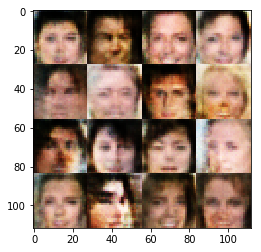

Epoch 1/1... Discriminator Loss: 1.0073... Generator Loss: 1.0559
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.0156... Generator Loss: 0.9792
Epoch 1/1... Discriminator Loss: 1.2271... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.1785... Generator Loss: 0.7334


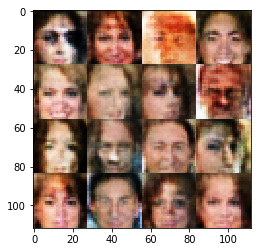

Epoch 1/1... Discriminator Loss: 1.4503... Generator Loss: 0.6261
Epoch 1/1... Discriminator Loss: 1.1599... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 0.9622... Generator Loss: 1.4260
Epoch 1/1... Discriminator Loss: 1.1446... Generator Loss: 1.2422
Epoch 1/1... Discriminator Loss: 0.9276... Generator Loss: 0.9641


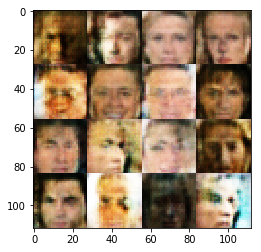

Epoch 1/1... Discriminator Loss: 1.2989... Generator Loss: 0.5226
Epoch 1/1... Discriminator Loss: 1.2492... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 0.8865... Generator Loss: 0.9674
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.5650
Epoch 1/1... Discriminator Loss: 1.1532... Generator Loss: 0.6015


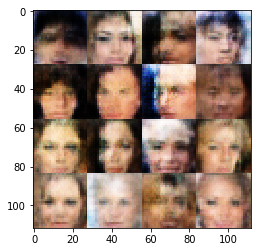

Epoch 1/1... Discriminator Loss: 1.5512... Generator Loss: 0.4796
Epoch 1/1... Discriminator Loss: 1.0186... Generator Loss: 1.0901
Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.5146
Epoch 1/1... Discriminator Loss: 1.0151... Generator Loss: 0.7736
Epoch 1/1... Discriminator Loss: 1.4515... Generator Loss: 0.5392


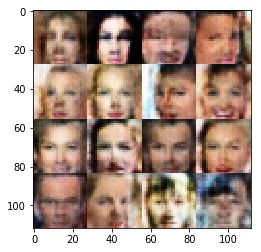

Epoch 1/1... Discriminator Loss: 0.9773... Generator Loss: 0.8521
Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 0.9920
Epoch 1/1... Discriminator Loss: 0.9969... Generator Loss: 0.9429
Epoch 1/1... Discriminator Loss: 1.5065... Generator Loss: 0.5786
Epoch 1/1... Discriminator Loss: 1.1008... Generator Loss: 0.9324


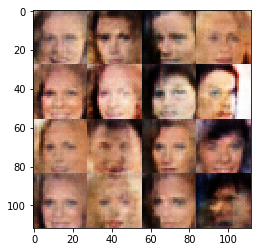

Epoch 1/1... Discriminator Loss: 1.0729... Generator Loss: 0.7636
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.4678
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.5008
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.6561
Epoch 1/1... Discriminator Loss: 1.1737... Generator Loss: 0.6584


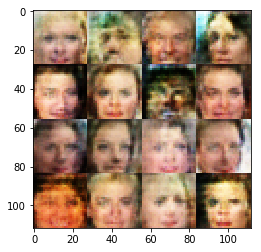

Epoch 1/1... Discriminator Loss: 1.1767... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.5084... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.1834... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 0.6630
Epoch 1/1... Discriminator Loss: 1.1606... Generator Loss: 0.7287


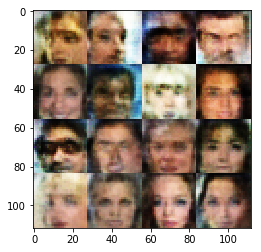

Epoch 1/1... Discriminator Loss: 1.2809... Generator Loss: 0.5824
Epoch 1/1... Discriminator Loss: 0.9135... Generator Loss: 0.9052
Epoch 1/1... Discriminator Loss: 1.2731... Generator Loss: 0.5666
Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.5798
Epoch 1/1... Discriminator Loss: 1.4867... Generator Loss: 0.6849


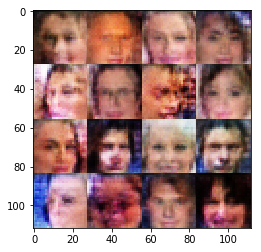

Epoch 1/1... Discriminator Loss: 1.1839... Generator Loss: 0.6492
Epoch 1/1... Discriminator Loss: 1.0654... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.0840... Generator Loss: 0.7988
Epoch 1/1... Discriminator Loss: 1.5796... Generator Loss: 0.4891
Epoch 1/1... Discriminator Loss: 1.0776... Generator Loss: 0.8674


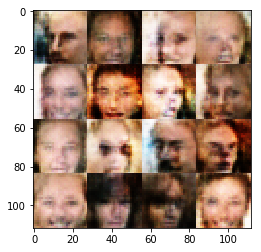

Epoch 1/1... Discriminator Loss: 1.4594... Generator Loss: 0.5505
Epoch 1/1... Discriminator Loss: 1.3757... Generator Loss: 0.6585
Epoch 1/1... Discriminator Loss: 0.7973... Generator Loss: 1.2297
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.5501
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 0.8475


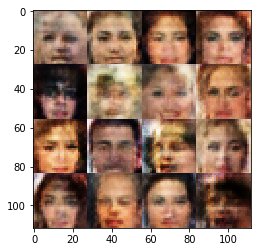

Epoch 1/1... Discriminator Loss: 1.6181... Generator Loss: 0.3821
Epoch 1/1... Discriminator Loss: 0.9159... Generator Loss: 1.2472
Epoch 1/1... Discriminator Loss: 1.0079... Generator Loss: 0.8475
Epoch 1/1... Discriminator Loss: 1.2144... Generator Loss: 0.6862
Epoch 1/1... Discriminator Loss: 1.5444... Generator Loss: 0.4449


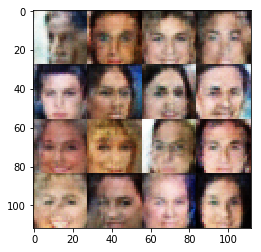

Epoch 1/1... Discriminator Loss: 1.2807... Generator Loss: 0.5469
Epoch 1/1... Discriminator Loss: 1.4926... Generator Loss: 0.4348
Epoch 1/1... Discriminator Loss: 1.6762... Generator Loss: 0.3273
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.6116


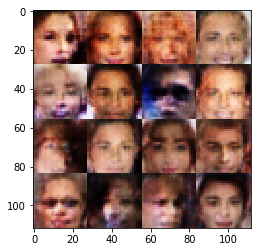

Epoch 1/1... Discriminator Loss: 1.4656... Generator Loss: 0.4206
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.6861
Epoch 1/1... Discriminator Loss: 0.8471... Generator Loss: 1.1068
Epoch 1/1... Discriminator Loss: 1.1393... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.2150... Generator Loss: 0.7560


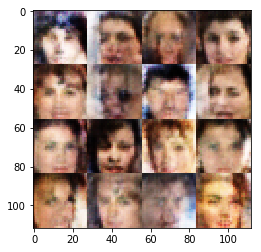

Epoch 1/1... Discriminator Loss: 0.9537... Generator Loss: 0.8902
Epoch 1/1... Discriminator Loss: 1.0001... Generator Loss: 1.1362
Epoch 1/1... Discriminator Loss: 0.8514... Generator Loss: 0.9471
Epoch 1/1... Discriminator Loss: 0.7839... Generator Loss: 1.7229
Epoch 1/1... Discriminator Loss: 0.8661... Generator Loss: 1.0174


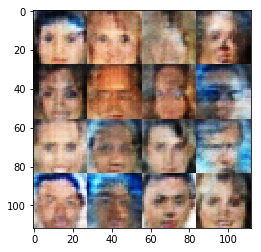

Epoch 1/1... Discriminator Loss: 1.0980... Generator Loss: 1.1683
Epoch 1/1... Discriminator Loss: 1.7806... Generator Loss: 0.3120
Epoch 1/1... Discriminator Loss: 1.1645... Generator Loss: 0.9086
Epoch 1/1... Discriminator Loss: 1.1886... Generator Loss: 0.7193
Epoch 1/1... Discriminator Loss: 1.3500... Generator Loss: 0.5184


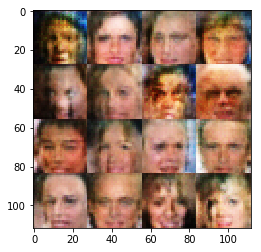

Epoch 1/1... Discriminator Loss: 1.7197... Generator Loss: 0.4603
Epoch 1/1... Discriminator Loss: 1.4566... Generator Loss: 0.4984
Epoch 1/1... Discriminator Loss: 1.3680... Generator Loss: 0.4776
Epoch 1/1... Discriminator Loss: 1.2128... Generator Loss: 0.5797
Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 0.9553


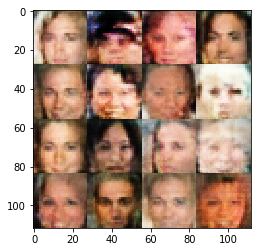

Epoch 1/1... Discriminator Loss: 1.2313... Generator Loss: 0.8326
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 0.4560
Epoch 1/1... Discriminator Loss: 1.1548... Generator Loss: 0.7341
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.2957... Generator Loss: 0.4989


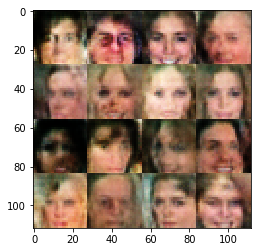

Epoch 1/1... Discriminator Loss: 1.0301... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.5841
Epoch 1/1... Discriminator Loss: 1.3716... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 1.6131... Generator Loss: 0.4359
Epoch 1/1... Discriminator Loss: 1.0070... Generator Loss: 0.8536


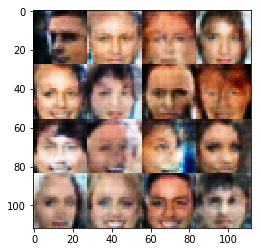

Epoch 1/1... Discriminator Loss: 1.2213... Generator Loss: 1.0834
Epoch 1/1... Discriminator Loss: 1.1665... Generator Loss: 0.6641
Epoch 1/1... Discriminator Loss: 2.0452... Generator Loss: 0.2039
Epoch 1/1... Discriminator Loss: 1.1334... Generator Loss: 1.0068
Epoch 1/1... Discriminator Loss: 0.7483... Generator Loss: 1.1467


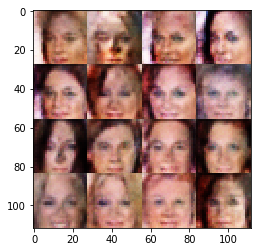

Epoch 1/1... Discriminator Loss: 1.6937... Generator Loss: 0.3535
Epoch 1/1... Discriminator Loss: 0.7765... Generator Loss: 1.2756
Epoch 1/1... Discriminator Loss: 1.2333... Generator Loss: 0.6429
Epoch 1/1... Discriminator Loss: 1.0886... Generator Loss: 0.9459
Epoch 1/1... Discriminator Loss: 1.7960... Generator Loss: 0.4315


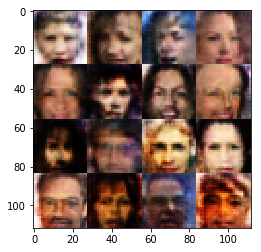

Epoch 1/1... Discriminator Loss: 1.0702... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 0.8590... Generator Loss: 1.2533
Epoch 1/1... Discriminator Loss: 1.2382... Generator Loss: 0.5757
Epoch 1/1... Discriminator Loss: 0.8207... Generator Loss: 1.5856
Epoch 1/1... Discriminator Loss: 0.8931... Generator Loss: 0.9565


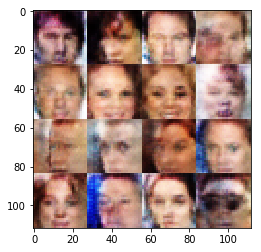

Epoch 1/1... Discriminator Loss: 1.4326... Generator Loss: 0.5141
Epoch 1/1... Discriminator Loss: 1.1005... Generator Loss: 0.7791
Epoch 1/1... Discriminator Loss: 1.0211... Generator Loss: 0.9419
Epoch 1/1... Discriminator Loss: 1.1947... Generator Loss: 0.7068
Epoch 1/1... Discriminator Loss: 1.0692... Generator Loss: 0.9663


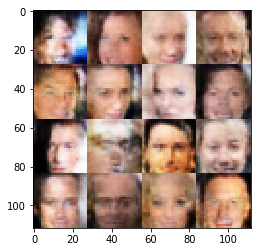

Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.5030
Epoch 1/1... Discriminator Loss: 1.0193... Generator Loss: 1.1787
Epoch 1/1... Discriminator Loss: 0.8611... Generator Loss: 1.2167
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.9153
Epoch 1/1... Discriminator Loss: 1.0525... Generator Loss: 0.8952


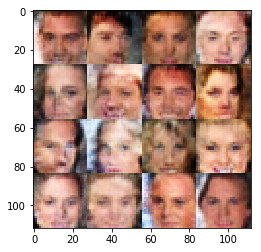

Epoch 1/1... Discriminator Loss: 1.3039... Generator Loss: 0.5567
Epoch 1/1... Discriminator Loss: 1.6741... Generator Loss: 0.3903
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 1.1617... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.6681... Generator Loss: 0.4494


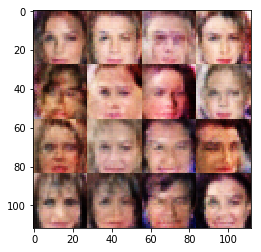

Epoch 1/1... Discriminator Loss: 1.1923... Generator Loss: 0.6154
Epoch 1/1... Discriminator Loss: 1.3259... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 1.0478... Generator Loss: 0.7763
Epoch 1/1... Discriminator Loss: 1.0571... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.5484


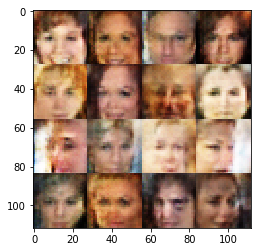

Epoch 1/1... Discriminator Loss: 1.3772... Generator Loss: 0.5819
Epoch 1/1... Discriminator Loss: 1.2232... Generator Loss: 0.6526
Epoch 1/1... Discriminator Loss: 1.0696... Generator Loss: 0.9297
Epoch 1/1... Discriminator Loss: 1.2958... Generator Loss: 0.6369
Epoch 1/1... Discriminator Loss: 1.3503... Generator Loss: 0.4837


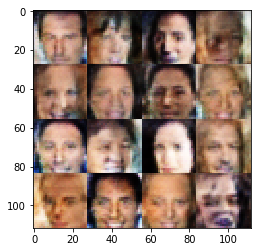

Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 0.7004
Epoch 1/1... Discriminator Loss: 1.3293... Generator Loss: 0.6100
Epoch 1/1... Discriminator Loss: 1.0661... Generator Loss: 0.8296
Epoch 1/1... Discriminator Loss: 0.9915... Generator Loss: 0.8715
Epoch 1/1... Discriminator Loss: 1.0494... Generator Loss: 0.9335


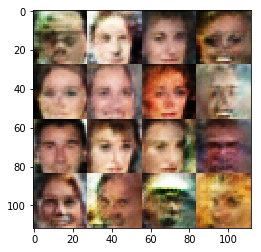

Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.5916
Epoch 1/1... Discriminator Loss: 1.2680... Generator Loss: 0.7509
Epoch 1/1... Discriminator Loss: 1.1600... Generator Loss: 0.6028
Epoch 1/1... Discriminator Loss: 1.1749... Generator Loss: 0.8732
Epoch 1/1... Discriminator Loss: 1.4045... Generator Loss: 0.5341


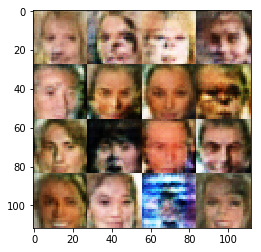

Epoch 1/1... Discriminator Loss: 1.5193... Generator Loss: 0.4013
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.5307
Epoch 1/1... Discriminator Loss: 1.2485... Generator Loss: 0.6698
Epoch 1/1... Discriminator Loss: 1.3809... Generator Loss: 0.5634
Epoch 1/1... Discriminator Loss: 1.5061... Generator Loss: 0.4858


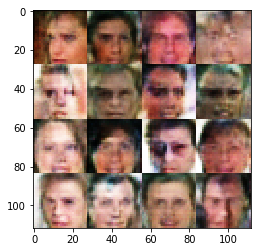

Epoch 1/1... Discriminator Loss: 0.9602... Generator Loss: 0.9274
Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.0423... Generator Loss: 0.9704
Epoch 1/1... Discriminator Loss: 1.1999... Generator Loss: 0.5737
Epoch 1/1... Discriminator Loss: 0.9322... Generator Loss: 0.9747


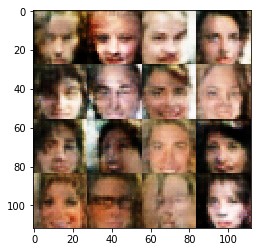

Epoch 1/1... Discriminator Loss: 0.8370... Generator Loss: 1.0378
Epoch 1/1... Discriminator Loss: 1.0708... Generator Loss: 0.8433
Epoch 1/1... Discriminator Loss: 1.6302... Generator Loss: 0.3968
Epoch 1/1... Discriminator Loss: 0.9684... Generator Loss: 0.9678
Epoch 1/1... Discriminator Loss: 1.2673... Generator Loss: 0.6071


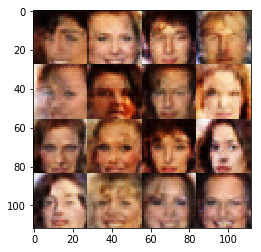

Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.6455
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.6235
Epoch 1/1... Discriminator Loss: 1.1636... Generator Loss: 0.7252
Epoch 1/1... Discriminator Loss: 1.0999... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.1973... Generator Loss: 0.7187


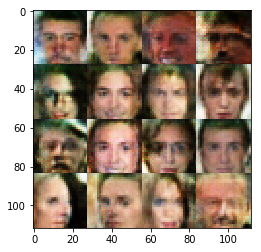

Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.4447
Epoch 1/1... Discriminator Loss: 1.4189... Generator Loss: 0.5639
Epoch 1/1... Discriminator Loss: 0.7972... Generator Loss: 1.1427
Epoch 1/1... Discriminator Loss: 0.9381... Generator Loss: 0.9345
Epoch 1/1... Discriminator Loss: 1.2013... Generator Loss: 0.6210


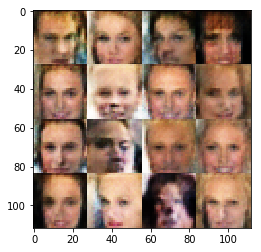

Epoch 1/1... Discriminator Loss: 1.8174... Generator Loss: 0.3154
Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 1.5981... Generator Loss: 0.3965
Epoch 1/1... Discriminator Loss: 1.2447... Generator Loss: 0.6111
Epoch 1/1... Discriminator Loss: 0.9509... Generator Loss: 0.9567


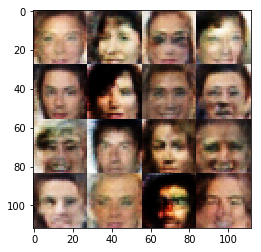

Epoch 1/1... Discriminator Loss: 1.0379... Generator Loss: 0.8073
Epoch 1/1... Discriminator Loss: 1.1982... Generator Loss: 0.6230
Epoch 1/1... Discriminator Loss: 0.9903... Generator Loss: 0.8562
Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.5079
Epoch 1/1... Discriminator Loss: 1.7870... Generator Loss: 0.3487


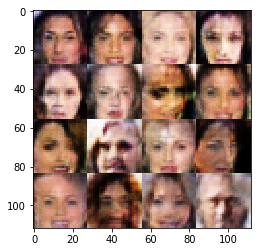

Epoch 1/1... Discriminator Loss: 1.0628... Generator Loss: 0.7840
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.5940
Epoch 1/1... Discriminator Loss: 1.3686... Generator Loss: 0.5856
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.6375
Epoch 1/1... Discriminator Loss: 0.9153... Generator Loss: 1.2524


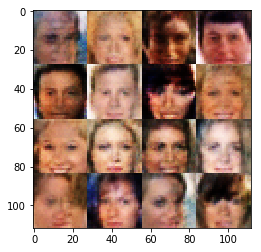

Epoch 1/1... Discriminator Loss: 1.2584... Generator Loss: 0.6349
Epoch 1/1... Discriminator Loss: 1.2321... Generator Loss: 0.6423
Epoch 1/1... Discriminator Loss: 1.2520... Generator Loss: 0.5408
Epoch 1/1... Discriminator Loss: 1.3390... Generator Loss: 0.5361
Epoch 1/1... Discriminator Loss: 1.2699... Generator Loss: 0.8275


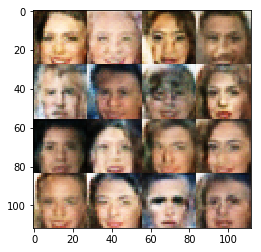

Epoch 1/1... Discriminator Loss: 1.5631... Generator Loss: 0.4158
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.4815
Epoch 1/1... Discriminator Loss: 1.3718... Generator Loss: 0.6193
Epoch 1/1... Discriminator Loss: 0.9774... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 1.3700... Generator Loss: 0.5270


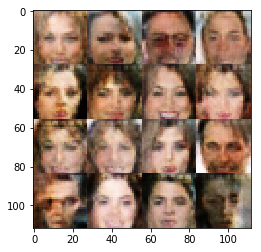

Epoch 1/1... Discriminator Loss: 1.3980... Generator Loss: 0.4660
Epoch 1/1... Discriminator Loss: 1.4415... Generator Loss: 0.4808
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.5397
Epoch 1/1... Discriminator Loss: 1.0850... Generator Loss: 0.7458
Epoch 1/1... Discriminator Loss: 0.9407... Generator Loss: 1.0189


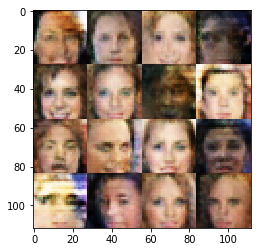

Epoch 1/1... Discriminator Loss: 1.1827... Generator Loss: 0.6634
Epoch 1/1... Discriminator Loss: 0.9069... Generator Loss: 0.8490
Epoch 1/1... Discriminator Loss: 1.1287... Generator Loss: 1.0122
Epoch 1/1... Discriminator Loss: 1.4749... Generator Loss: 0.4665
Epoch 1/1... Discriminator Loss: 1.4705... Generator Loss: 0.5436


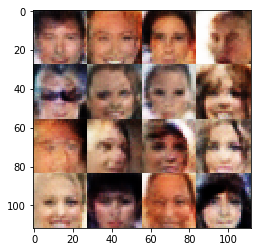

Epoch 1/1... Discriminator Loss: 0.9817... Generator Loss: 0.8313
Epoch 1/1... Discriminator Loss: 0.7880... Generator Loss: 1.1744
Epoch 1/1... Discriminator Loss: 0.8536... Generator Loss: 1.0973
Epoch 1/1... Discriminator Loss: 1.3421... Generator Loss: 0.6390
Epoch 1/1... Discriminator Loss: 1.4076... Generator Loss: 0.4773


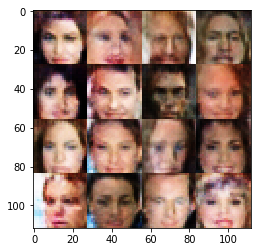

Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 0.8853
Epoch 1/1... Discriminator Loss: 1.5738... Generator Loss: 0.3765
Epoch 1/1... Discriminator Loss: 1.5984... Generator Loss: 0.4222
Epoch 1/1... Discriminator Loss: 1.1227... Generator Loss: 0.6819
Epoch 1/1... Discriminator Loss: 1.0552... Generator Loss: 0.8522


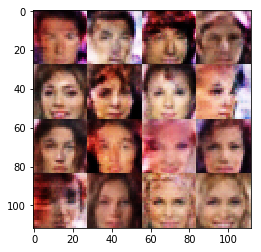

Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.4396
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.5717
Epoch 1/1... Discriminator Loss: 1.2716... Generator Loss: 0.6068
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.4947
Epoch 1/1... Discriminator Loss: 1.3526... Generator Loss: 0.6067


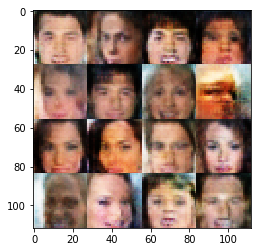

Epoch 1/1... Discriminator Loss: 0.8675... Generator Loss: 1.1963
Epoch 1/1... Discriminator Loss: 1.5501... Generator Loss: 0.6651
Epoch 1/1... Discriminator Loss: 1.2039... Generator Loss: 0.7063
Epoch 1/1... Discriminator Loss: 1.0440... Generator Loss: 0.7599
Epoch 1/1... Discriminator Loss: 1.1507... Generator Loss: 0.8397


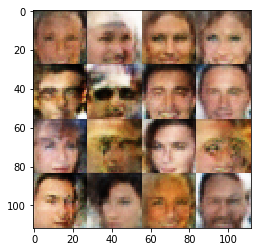

Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 0.6469
Epoch 1/1... Discriminator Loss: 1.5904... Generator Loss: 0.3796
Epoch 1/1... Discriminator Loss: 1.6843... Generator Loss: 0.3836
Epoch 1/1... Discriminator Loss: 0.9406... Generator Loss: 1.0353
Epoch 1/1... Discriminator Loss: 1.1770... Generator Loss: 1.0325


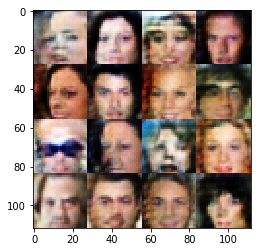

Epoch 1/1... Discriminator Loss: 1.4526... Generator Loss: 0.4339
Epoch 1/1... Discriminator Loss: 1.2081... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.2949... Generator Loss: 0.6049
Epoch 1/1... Discriminator Loss: 1.1257... Generator Loss: 0.8081
Epoch 1/1... Discriminator Loss: 1.0105... Generator Loss: 0.7477


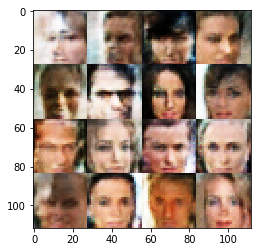

Epoch 1/1... Discriminator Loss: 1.2382... Generator Loss: 0.8151
Epoch 1/1... Discriminator Loss: 1.5376... Generator Loss: 0.4262
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.4150... Generator Loss: 0.5150
Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.5006


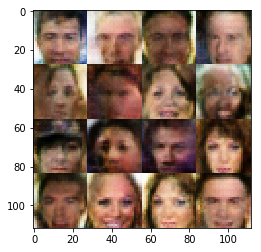

Epoch 1/1... Discriminator Loss: 1.0208... Generator Loss: 0.9531
Epoch 1/1... Discriminator Loss: 1.2571... Generator Loss: 0.5812
Epoch 1/1... Discriminator Loss: 1.7498... Generator Loss: 0.3621
Epoch 1/1... Discriminator Loss: 1.0638... Generator Loss: 0.8336
Epoch 1/1... Discriminator Loss: 1.0646... Generator Loss: 0.9524


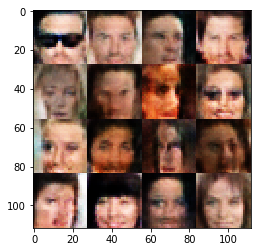

Epoch 1/1... Discriminator Loss: 1.0220... Generator Loss: 1.0345
Epoch 1/1... Discriminator Loss: 0.8485... Generator Loss: 1.3513
Epoch 1/1... Discriminator Loss: 1.0401... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.2427... Generator Loss: 0.7051
Epoch 1/1... Discriminator Loss: 1.0984... Generator Loss: 0.7547


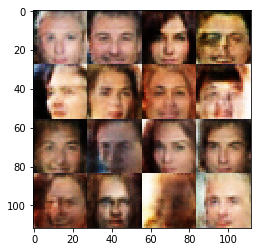

Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 0.6051
Epoch 1/1... Discriminator Loss: 1.2103... Generator Loss: 0.6375
Epoch 1/1... Discriminator Loss: 1.2520... Generator Loss: 0.8044
Epoch 1/1... Discriminator Loss: 1.0167... Generator Loss: 0.9515
Epoch 1/1... Discriminator Loss: 1.3760... Generator Loss: 0.5418


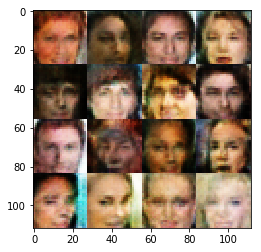

Epoch 1/1... Discriminator Loss: 1.1052... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 0.6232
Epoch 1/1... Discriminator Loss: 1.1245... Generator Loss: 0.7526
Epoch 1/1... Discriminator Loss: 0.9757... Generator Loss: 0.9017
Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.4574


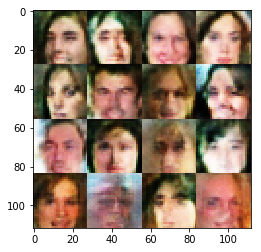

Epoch 1/1... Discriminator Loss: 0.8825... Generator Loss: 1.0716
Epoch 1/1... Discriminator Loss: 0.9601... Generator Loss: 0.8309
Epoch 1/1... Discriminator Loss: 1.3975... Generator Loss: 0.5947
Epoch 1/1... Discriminator Loss: 1.2383... Generator Loss: 0.5990
Epoch 1/1... Discriminator Loss: 1.0974... Generator Loss: 0.6740


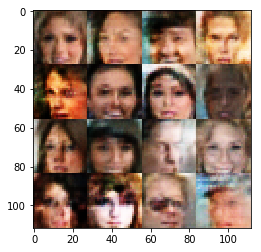

Epoch 1/1... Discriminator Loss: 1.4633... Generator Loss: 0.4845
Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.0966... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.5512
Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 0.8194


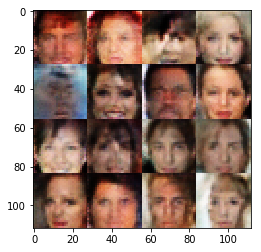

Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.6870
Epoch 1/1... Discriminator Loss: 1.1189... Generator Loss: 1.0034
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 1.0253... Generator Loss: 1.1401
Epoch 1/1... Discriminator Loss: 1.0955... Generator Loss: 0.7453


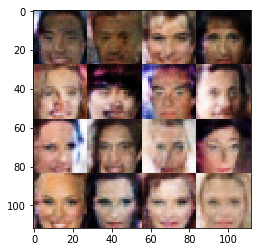

Epoch 1/1... Discriminator Loss: 1.1757... Generator Loss: 0.9157
Epoch 1/1... Discriminator Loss: 1.0508... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 1.2512... Generator Loss: 0.6389
Epoch 1/1... Discriminator Loss: 1.1486... Generator Loss: 1.1879
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.5185


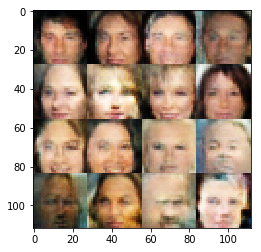

Epoch 1/1... Discriminator Loss: 0.8349... Generator Loss: 1.1763
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.6109
Epoch 1/1... Discriminator Loss: 0.9213... Generator Loss: 1.1189
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.7094
Epoch 1/1... Discriminator Loss: 1.2491... Generator Loss: 0.5362


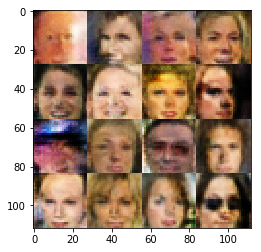

Epoch 1/1... Discriminator Loss: 1.0334... Generator Loss: 0.7947
Epoch 1/1... Discriminator Loss: 1.0256... Generator Loss: 0.7941
Epoch 1/1... Discriminator Loss: 1.2971... Generator Loss: 0.9131
Epoch 1/1... Discriminator Loss: 1.5277... Generator Loss: 0.4548
Epoch 1/1... Discriminator Loss: 1.9384... Generator Loss: 0.2918


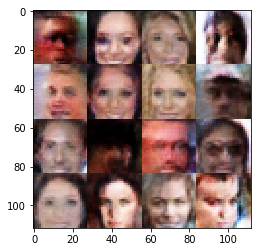

Epoch 1/1... Discriminator Loss: 1.2552... Generator Loss: 0.6815
Epoch 1/1... Discriminator Loss: 0.9664... Generator Loss: 0.8209
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 0.8034
Epoch 1/1... Discriminator Loss: 0.8471... Generator Loss: 0.9715
Epoch 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.8639


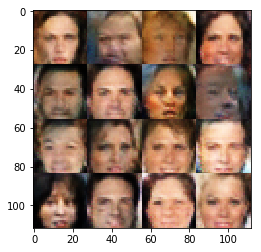

Epoch 1/1... Discriminator Loss: 1.7822... Generator Loss: 0.3716
Epoch 1/1... Discriminator Loss: 1.6475... Generator Loss: 0.4284
Epoch 1/1... Discriminator Loss: 1.1593... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.4907... Generator Loss: 0.4387
Epoch 1/1... Discriminator Loss: 1.0192... Generator Loss: 0.8406


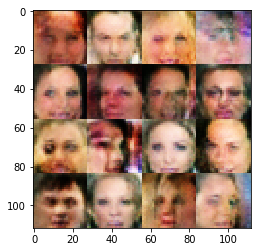

Epoch 1/1... Discriminator Loss: 1.0709... Generator Loss: 0.7104
Epoch 1/1... Discriminator Loss: 1.1405... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.5195... Generator Loss: 0.4909
Epoch 1/1... Discriminator Loss: 1.1351... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 1.2610... Generator Loss: 0.6525


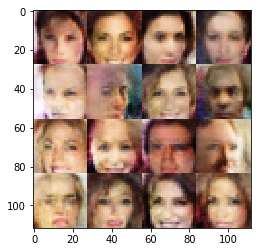

Epoch 1/1... Discriminator Loss: 1.2074... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 1.0120... Generator Loss: 0.7559
Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.4479
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 0.8850... Generator Loss: 0.9594


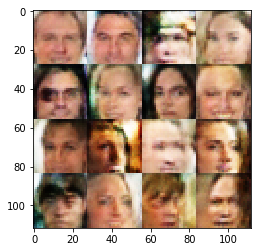

Epoch 1/1... Discriminator Loss: 1.5033... Generator Loss: 0.4031
Epoch 1/1... Discriminator Loss: 1.0314... Generator Loss: 0.9234
Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.4947
Epoch 1/1... Discriminator Loss: 1.0303... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 0.6731


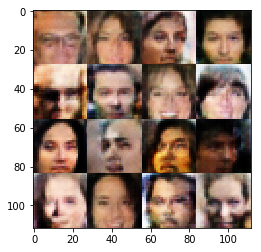

Epoch 1/1... Discriminator Loss: 1.2736... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.3351... Generator Loss: 0.4877
Epoch 1/1... Discriminator Loss: 0.9928... Generator Loss: 0.8361
Epoch 1/1... Discriminator Loss: 1.0181... Generator Loss: 0.7323
Epoch 1/1... Discriminator Loss: 0.9054... Generator Loss: 0.8740


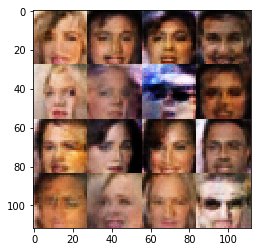

Epoch 1/1... Discriminator Loss: 0.9920... Generator Loss: 0.9127
Epoch 1/1... Discriminator Loss: 1.3354... Generator Loss: 0.5449
Epoch 1/1... Discriminator Loss: 1.0014... Generator Loss: 0.8514
Epoch 1/1... Discriminator Loss: 1.4064... Generator Loss: 0.5976
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.6428


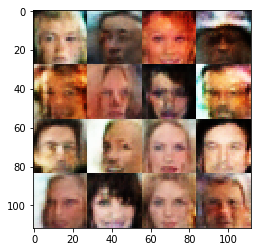

Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 0.5154
Epoch 1/1... Discriminator Loss: 0.8772... Generator Loss: 0.9924
Epoch 1/1... Discriminator Loss: 1.1839... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.0801... Generator Loss: 0.6585
Epoch 1/1... Discriminator Loss: 1.2443... Generator Loss: 0.7100


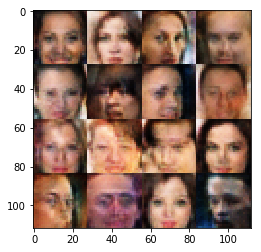

Epoch 1/1... Discriminator Loss: 1.1097... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.1230... Generator Loss: 0.7422
Epoch 1/1... Discriminator Loss: 1.1820... Generator Loss: 1.0531
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.5288


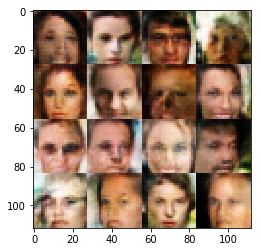

Epoch 1/1... Discriminator Loss: 1.6955... Generator Loss: 0.3376
Epoch 1/1... Discriminator Loss: 1.6219... Generator Loss: 0.3993
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.6882
Epoch 1/1... Discriminator Loss: 1.2365... Generator Loss: 0.5783
Epoch 1/1... Discriminator Loss: 1.1360... Generator Loss: 0.7357


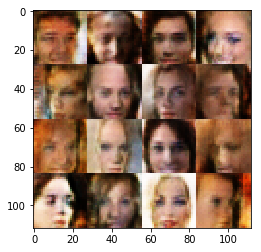

Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.6007
Epoch 1/1... Discriminator Loss: 1.1206... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 1.3553... Generator Loss: 0.5572
Epoch 1/1... Discriminator Loss: 1.8672... Generator Loss: 0.3392
Epoch 1/1... Discriminator Loss: 1.0922... Generator Loss: 0.7445


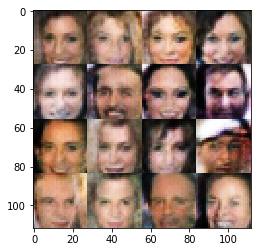

Epoch 1/1... Discriminator Loss: 1.2249... Generator Loss: 0.7258
Epoch 1/1... Discriminator Loss: 1.1390... Generator Loss: 0.7417
Epoch 1/1... Discriminator Loss: 1.3671... Generator Loss: 0.4951
Epoch 1/1... Discriminator Loss: 1.0968... Generator Loss: 0.8545
Epoch 1/1... Discriminator Loss: 1.0277... Generator Loss: 0.7975


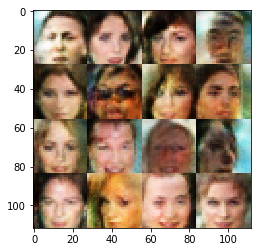

Epoch 1/1... Discriminator Loss: 1.3260... Generator Loss: 0.5290
Epoch 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.5006
Epoch 1/1... Discriminator Loss: 1.1395... Generator Loss: 0.6767
Epoch 1/1... Discriminator Loss: 1.2001... Generator Loss: 0.7384
Epoch 1/1... Discriminator Loss: 0.9405... Generator Loss: 0.9531


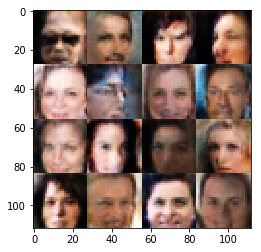

Epoch 1/1... Discriminator Loss: 1.2671... Generator Loss: 0.6656
Epoch 1/1... Discriminator Loss: 0.9504... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.5772
Epoch 1/1... Discriminator Loss: 0.9830... Generator Loss: 0.8851
Epoch 1/1... Discriminator Loss: 1.9288... Generator Loss: 0.3472


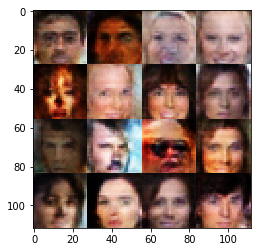

Epoch 1/1... Discriminator Loss: 1.2145... Generator Loss: 0.5919
Epoch 1/1... Discriminator Loss: 1.6440... Generator Loss: 0.4152
Epoch 1/1... Discriminator Loss: 1.1422... Generator Loss: 0.8273
Epoch 1/1... Discriminator Loss: 0.8048... Generator Loss: 1.0218
Epoch 1/1... Discriminator Loss: 1.1875... Generator Loss: 0.7962


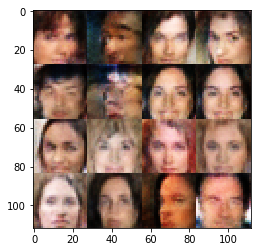

Epoch 1/1... Discriminator Loss: 1.2440... Generator Loss: 0.5858
Epoch 1/1... Discriminator Loss: 1.1219... Generator Loss: 0.7153
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 0.8832... Generator Loss: 1.0232
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 0.8415


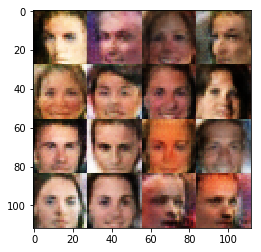

Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.4605
Epoch 1/1... Discriminator Loss: 1.0536... Generator Loss: 0.7715
Epoch 1/1... Discriminator Loss: 1.1448... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 0.9467... Generator Loss: 1.0732
Epoch 1/1... Discriminator Loss: 1.0702... Generator Loss: 0.6942


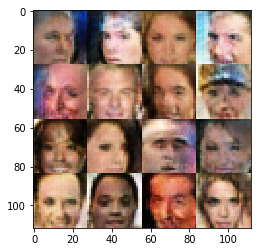

Epoch 1/1... Discriminator Loss: 1.1642... Generator Loss: 0.7446
Epoch 1/1... Discriminator Loss: 1.2536... Generator Loss: 0.6066
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.5375
Epoch 1/1... Discriminator Loss: 0.8336... Generator Loss: 1.1202
Epoch 1/1... Discriminator Loss: 0.9825... Generator Loss: 0.7886


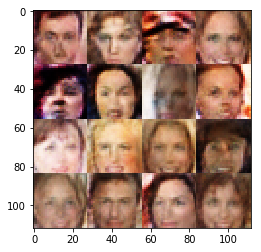

Epoch 1/1... Discriminator Loss: 1.4453... Generator Loss: 0.4257
Epoch 1/1... Discriminator Loss: 1.1225... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.5420
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.4992
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.6926


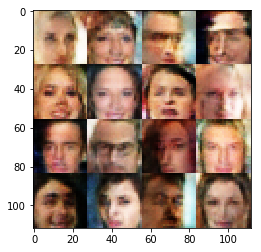

Epoch 1/1... Discriminator Loss: 1.1247... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 0.9351... Generator Loss: 1.0599
Epoch 1/1... Discriminator Loss: 0.9321... Generator Loss: 0.9653


In [13]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5

epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)